# **Task 1: Comparative Edge Detection**

Install required libraries

In [65]:
!pip install -q kagglehub opencv-python scikit-image

Import libraries

In [66]:
import os
import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage.filters import prewitt

Download HAM10000 dataset

In [67]:
import kagglehub

dataset_path = kagglehub.dataset_download(
    "kmader/skin-cancer-mnist-ham10000"
)

print("Dataset downloaded successfully!")
print("Dataset path:", dataset_path)

Using Colab cache for faster access to the 'skin-cancer-mnist-ham10000' dataset.
Dataset downloaded successfully!
Dataset path: /kaggle/input/skin-cancer-mnist-ham10000


Find the metadata file

In [68]:
csv_files = glob.glob(
    os.path.join(dataset_path, "**", "*.csv"),
    recursive=True
)

print("CSV files found:")

for file in csv_files:
    print(file)

CSV files found:
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv


In [69]:
metadata_file = None

for file in csv_files:
    if "metadata" in os.path.basename(file).lower():
        metadata_file = file
        break

print("Using file:")
print(metadata_file)

df = pd.read_csv(metadata_file)

print("\nDataset shape:")
print(df.shape)

display(df.head())

Using file:
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv

Dataset shape:
(10015, 7)


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


Check the available classes

In [70]:
print("Available classes:\n")

print(df["dx"].value_counts())

Available classes:

dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


Select 3 images from each class

In [71]:
SELECTED_CLASSES = ["akiec", "bcc", "mel"]

SAMPLES_PER_CLASS = 3

selected_df = (
    df[df["dx"].isin(SELECTED_CLASSES)]
    .groupby("dx", group_keys=False)
    .head(SAMPLES_PER_CLASS)
)

print("Selected images:")
display(selected_df[["image_id", "dx"]])

Selected images:


,image_id,dx
1211,ISIC_0025964,mel
1212,ISIC_0030623,mel
1213,ISIC_0027190,mel
2462,ISIC_0028155,bcc
2463,ISIC_0034093,bcc
2464,ISIC_0029230,bcc
9687,ISIC_0029417,akiec
9688,ISIC_0029915,akiec
9689,ISIC_0029360,akiec


In [72]:
print("\nNumber of images per class:")
print(selected_df["dx"].value_counts())


Number of images per class:
dx
mel      3
bcc      3
akiec    3
Name: count, dtype: int64


Find the actual image files

In [73]:
image_files = glob.glob(
    os.path.join(dataset_path, "**", "*.jpg"),
    recursive=True
)

print("Total JPG images found:", len(image_files))

Total JPG images found: 20030


In [74]:
image_path_dict = {}

for path in image_files:

    filename = os.path.basename(path)

    image_id = os.path.splitext(filename)[0]

    image_path_dict[image_id] = path

print("Image dictionary created.")
print("Total images:", len(image_path_dict))

Image dictionary created.
Total images: 10015


Load the selected images

In [75]:
images = []

for _, row in selected_df.iterrows():

    image_id = row["image_id"]
    class_name = row["dx"]

    image_path = image_path_dict.get(image_id)

    if image_path is None:
        print("Image not found:", image_id)
        continue

    # Read image
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    # Resize
    image = cv2.resize(
        image,
        (224, 224)
    )

    images.append({
        "image_id": image_id,
        "class": class_name,
        "image": image
    })

print("Successfully loaded:", len(images), "images")

Successfully loaded: 9 images


Display the original images

In [76]:
# Load the selected images

images = []

for _, row in selected_df.iterrows():

    image_id = row["image_id"]
    class_name = row["dx"]

    image_path = image_path_dict.get(image_id)

    if image_path is None:
        print("Image not found:", image_id)
        continue

    # Read image
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image
    image = cv2.resize(image, (224, 224))

    images.append({
        "image_id": image_id,
        "class": class_name,
        "image": image
    })

print("Successfully loaded:", len(images), "images")

Successfully loaded: 9 images


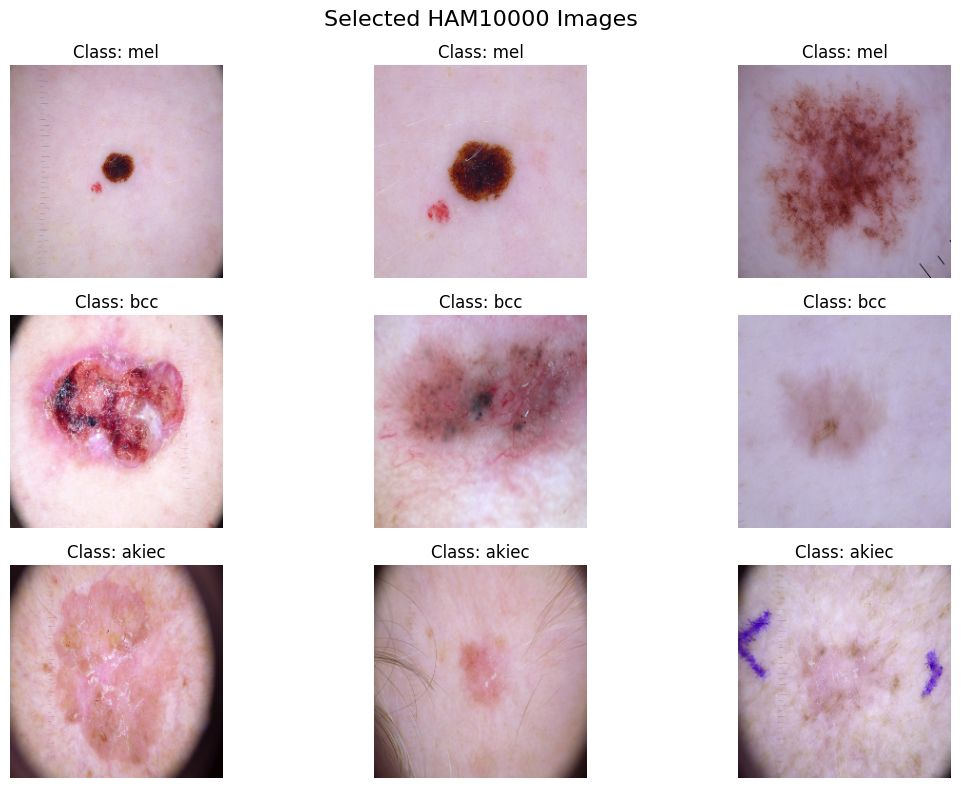

In [77]:
plt.figure(figsize=(12, 8))

for i, item in enumerate(images):

    plt.subplot(3, 3, i + 1)

    plt.imshow(item["image"])

    plt.title(
        f"Class: {item['class']}"
    )

    plt.axis("off")

plt.suptitle(
    "Selected HAM10000 Images",
    fontsize=16
)

plt.tight_layout()
plt.show()

Create the edge detection function

In [78]:
def edge_detection(image):

    # Convert RGB to grayscale
    gray = cv2.cvtColor(
        image,
        cv2.COLOR_RGB2GRAY
    )

    # ==========================================
    # 1. SOBEL Gx
    # ==========================================

    sobel_x = cv2.Sobel(
        gray,
        cv2.CV_64F,
        1,
        0,
        ksize=3
    )

    sobel_x = cv2.convertScaleAbs(sobel_x)

    # ==========================================
    # 2. SOBEL Gy
    # ==========================================

    sobel_y = cv2.Sobel(
        gray,
        cv2.CV_64F,
        0,
        1,
        ksize=3
    )

    sobel_y = cv2.convertScaleAbs(sobel_y)

    # ==========================================
    # 3. SOBEL GRADIENT MAGNITUDE
    # ==========================================

    sobel_x_float = cv2.Sobel(
        gray,
        cv2.CV_64F,
        1,
        0,
        ksize=3
    )

    sobel_y_float = cv2.Sobel(
        gray,
        cv2.CV_64F,
        0,
        1,
        ksize=3
    )

    magnitude = np.sqrt(
        sobel_x_float ** 2 +
        sobel_y_float ** 2
    )

    magnitude = np.uint8(
        np.clip(magnitude, 0, 255)
    )

    # ==========================================
    # 4. PREWITT
    # ==========================================

    prewitt_result = prewitt(gray)

    prewitt_result = (
        prewitt_result * 255
    ).astype(np.uint8)

    # ==========================================
    # 5. LAPLACIAN
    # ==========================================

    laplacian = cv2.Laplacian(
        gray,
        cv2.CV_64F
    )

    laplacian = cv2.convertScaleAbs(
        laplacian
    )

    # ==========================================
    # 6. LAPLACIAN OF GAUSSIAN (LoG)
    # ==========================================

    blurred = cv2.GaussianBlur(
        gray,
        (5, 5),
        0
    )

    log = cv2.Laplacian(
        blurred,
        cv2.CV_64F
    )

    log = cv2.convertScaleAbs(log)

    # ==========================================
    # 7. CANNY
    # ==========================================

    canny = cv2.Canny(
        gray,
        50,
        150
    )

    return {
        "gray": gray,
        "sobel_x": sobel_x,
        "sobel_y": sobel_y,
        "sobel_magnitude": magnitude,
        "prewitt": prewitt_result,
        "laplacian": laplacian,
        "log": log,
        "canny": canny
    }

Display ALL edge detectors

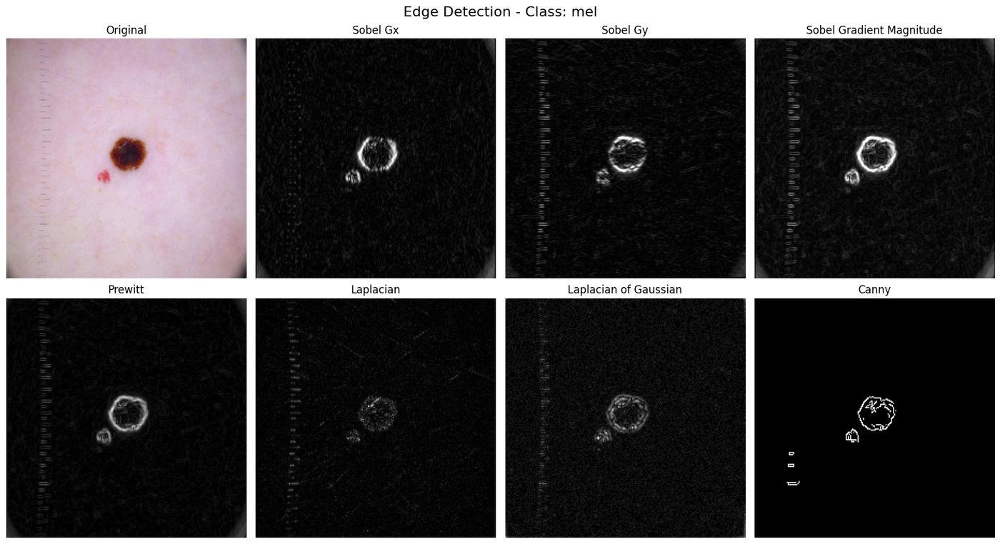

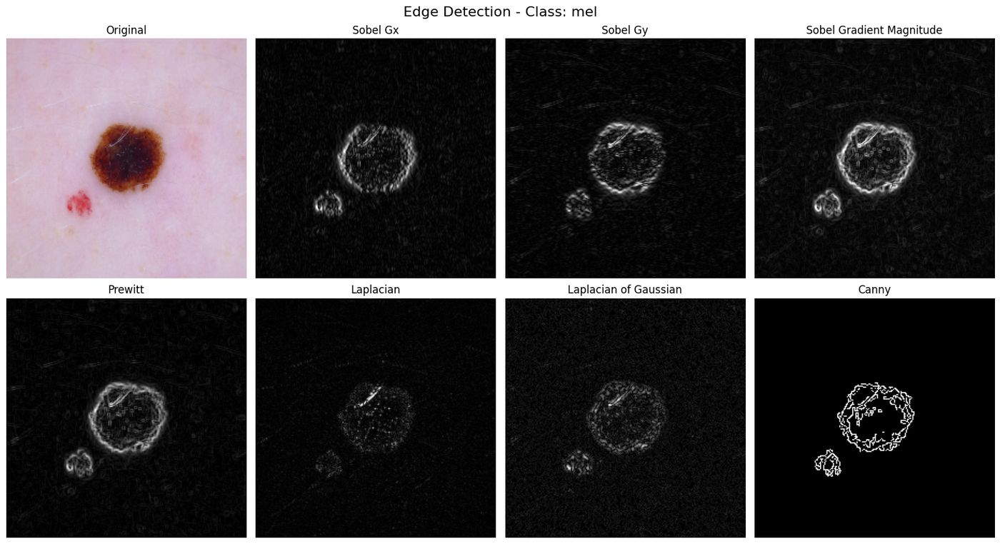

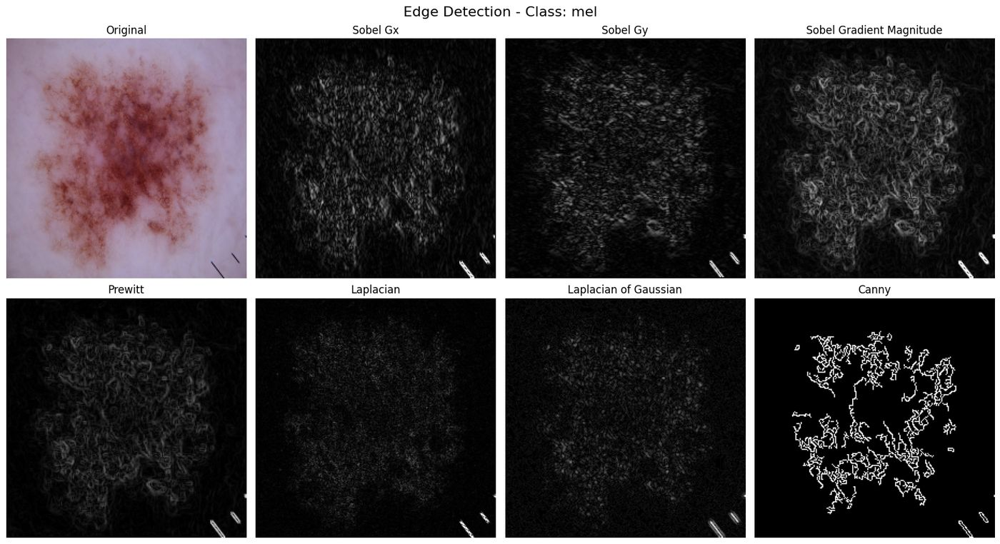

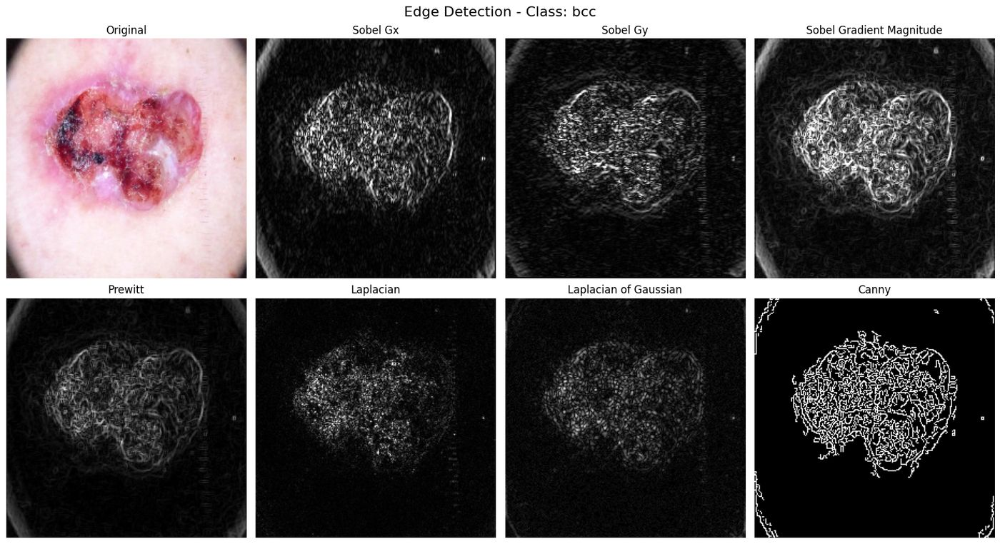

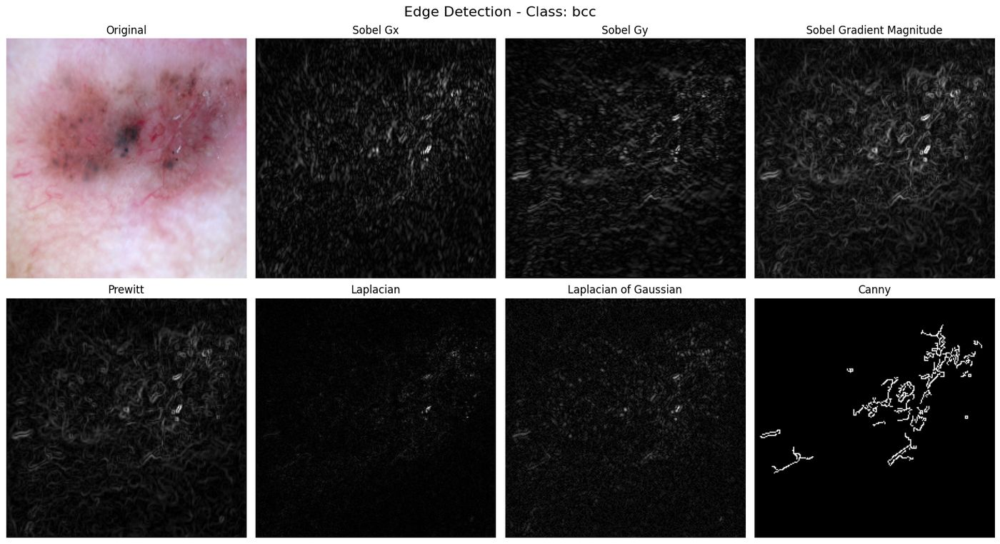

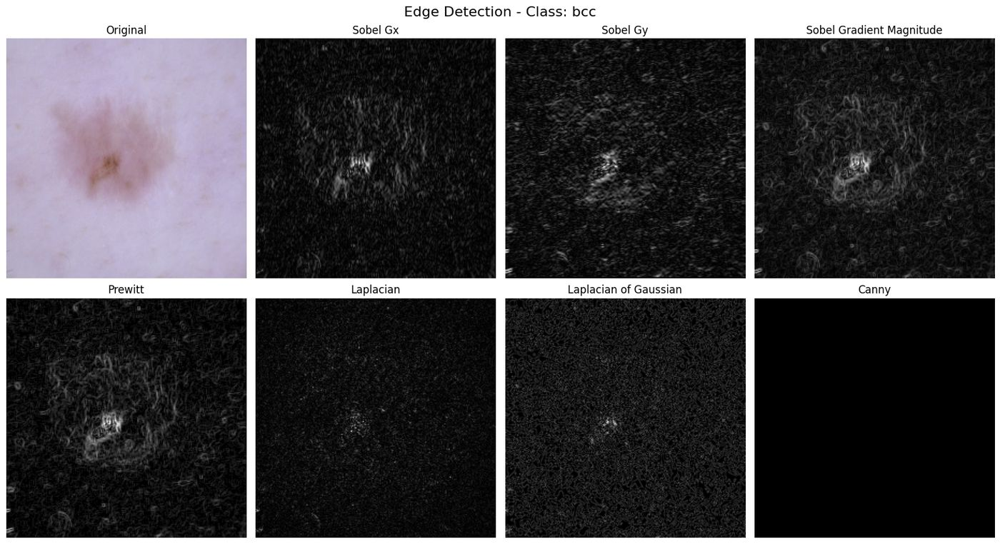

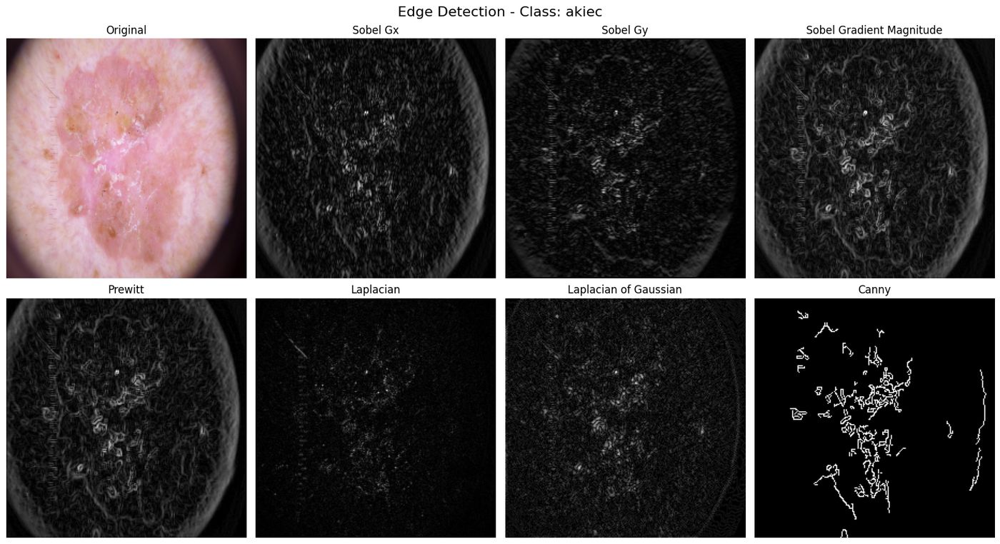

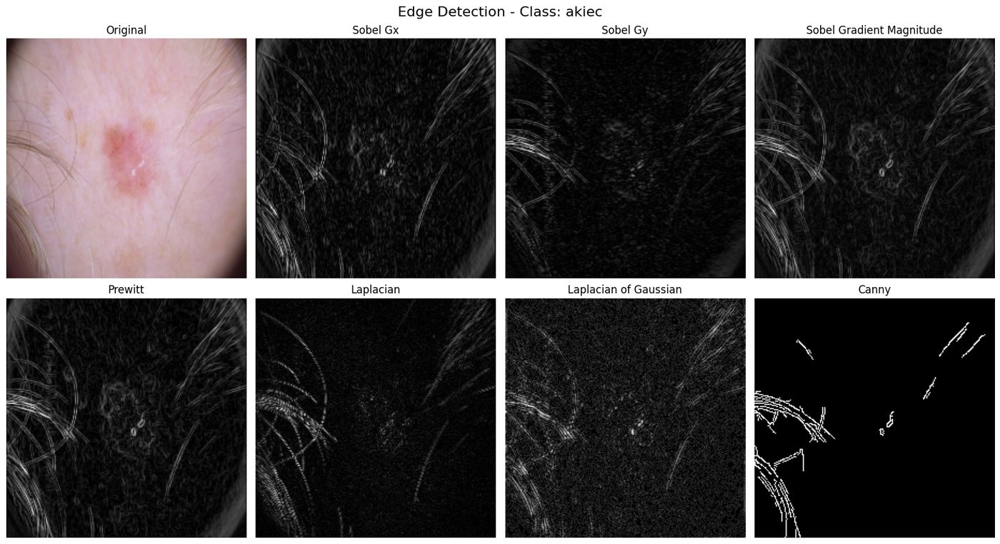

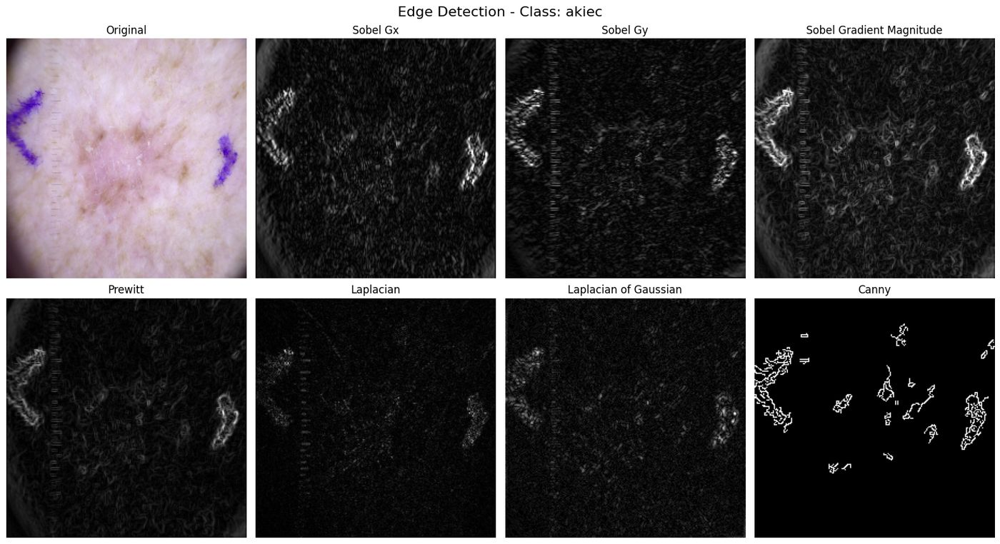

In [79]:
for item in images:

    image = item["image"]
    class_name = item["class"]
    image_id = item["image_id"]

    result = edge_detection(image)

    plt.figure(figsize=(16, 9))

    # Original
    plt.subplot(2, 4, 1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")

    # Sobel Gx
    plt.subplot(2, 4, 2)
    plt.imshow(
        result["sobel_x"],
        cmap="gray"
    )
    plt.title("Sobel Gx")
    plt.axis("off")

    # Sobel Gy
    plt.subplot(2, 4, 3)
    plt.imshow(
        result["sobel_y"],
        cmap="gray"
    )
    plt.title("Sobel Gy")
    plt.axis("off")

    # Sobel Magnitude
    plt.subplot(2, 4, 4)
    plt.imshow(
        result["sobel_magnitude"],
        cmap="gray"
    )
    plt.title("Sobel Gradient Magnitude")
    plt.axis("off")

    # Prewitt
    plt.subplot(2, 4, 5)
    plt.imshow(
        result["prewitt"],
        cmap="gray"
    )
    plt.title("Prewitt")
    plt.axis("off")

    # Laplacian
    plt.subplot(2, 4, 6)
    plt.imshow(
        result["laplacian"],
        cmap="gray"
    )
    plt.title("Laplacian")
    plt.axis("off")

    # LoG
    plt.subplot(2, 4, 7)
    plt.imshow(
        result["log"],
        cmap="gray"
    )
    plt.title("Laplacian of Gaussian")
    plt.axis("off")

    # Canny
    plt.subplot(2, 4, 8)
    plt.imshow(
        result["canny"],
        cmap="gray"
    )
    plt.title("Canny")
    plt.axis("off")

    plt.suptitle(
        f"Edge Detection - Class: {class_name}",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

Create the REQUIRED FIGURE

In [80]:
representatives = []

for class_name in SELECTED_CLASSES:

    for item in images:

        if item["class"] == class_name:

            representatives.append(item)

            break

print(
    "Representative images:",
    len(representatives)
)

Representative images: 3


Generate the final required figure

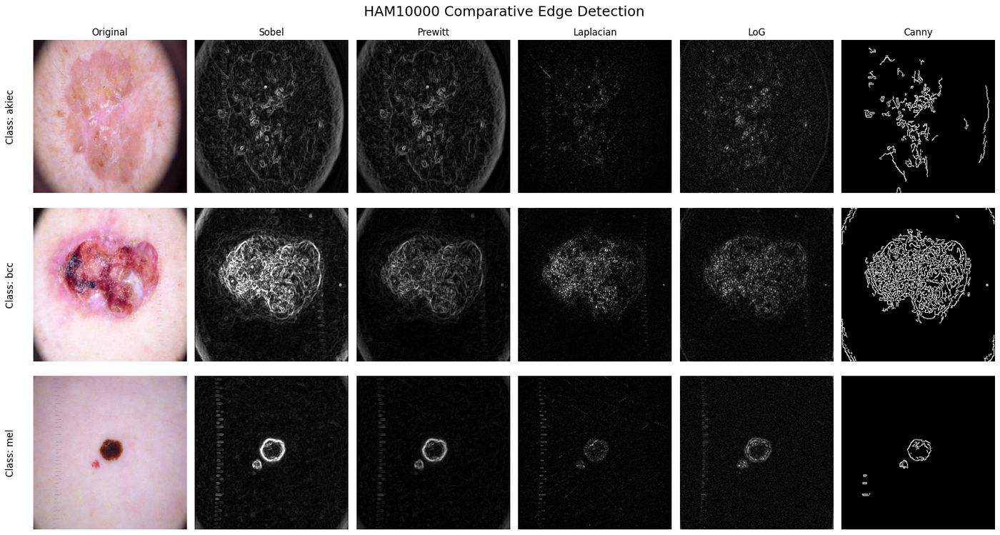

In [81]:
plt.figure(figsize=(18, 10))

for row, item in enumerate(representatives):

    image = item["image"]
    class_name = item["class"]

    result = edge_detection(image)

    comparison = [
        image,
        result["sobel_magnitude"],
        result["prewitt"],
        result["laplacian"],
        result["log"],
        result["canny"]
    ]

    titles = [
        "Original",
        "Sobel",
        "Prewitt",
        "Laplacian",
        "LoG",
        "Canny"
    ]

    for col in range(6):

        plt.subplot(
            len(representatives),
            6,
            row * 6 + col + 1
        )

        if col == 0:

            plt.imshow(
                comparison[col]
            )

        else:

            plt.imshow(
                comparison[col],
                cmap="gray"
            )

        plt.axis("off")

        if row == 0:
            plt.title(
                titles[col],
                fontsize=12
            )

    # Class label
    plt.text(
        -0.18,
        0.5,
        f"Class: {class_name}",
        transform=plt.subplot(
            len(representatives),
            6,
            row * 6 + 1
        ).transAxes,
        rotation=90,
        va="center",
        fontsize=12
    )

plt.suptitle(
    "HAM10000 Comparative Edge Detection",
    fontsize=18
)

plt.tight_layout()
plt.show()

TASK 2 — Effect of Noise on Edge Detection

Add Gaussian Noise

In [82]:
# ============================================
# STEP 1: GAUSSIAN NOISE
# ============================================

def add_gaussian_noise(image, mean=0, sigma=25):

    # Convert image to float
    image_float = image.astype(np.float32)

    # Generate Gaussian noise
    noise = np.random.normal(
        mean,
        sigma,
        image.shape
    )

    # Add noise
    noisy_image = image_float + noise

    # Keep pixel values between 0 and 255
    noisy_image = np.clip(
        noisy_image,
        0,
        255
    )

    return noisy_image.astype(np.uint8)

Add Salt-and-Pepper Noise

In [83]:
# ============================================
# STEP 2: SALT AND PEPPER NOISE
# ============================================

def add_salt_pepper_noise(
    image,
    amount=0.03
):

    noisy_image = image.copy()

    # Total number of pixels
    total_pixels = image.shape[0] * image.shape[1]

    # Number of noisy pixels
    number_of_pixels = int(
        amount * total_pixels
    )

    # -------------------------
    # Salt noise
    # -------------------------

    salt_y = np.random.randint(
        0,
        image.shape[0],
        number_of_pixels // 2
    )

    salt_x = np.random.randint(
        0,
        image.shape[1],
        number_of_pixels // 2
    )

    noisy_image[
        salt_y,
        salt_x
    ] = 255

    # -------------------------
    # Pepper noise
    # -------------------------

    pepper_y = np.random.randint(
        0,
        image.shape[0],
        number_of_pixels // 2
    )

    pepper_x = np.random.randint(
        0,
        image.shape[1],
        number_of_pixels // 2
    )

    noisy_image[
        pepper_y,
        pepper_x
    ] = 0

    return noisy_image

Create Gaussian and Salt-and-Pepper noisy images

In [84]:
# ============================================
# STEP 3: CREATE NOISY IMAGES
# ============================================

for item in images:

    original = item["image"]

    item["gaussian_noisy"] = add_gaussian_noise(
        original
    )

    item["salt_pepper_noisy"] = add_salt_pepper_noise(
        original
    )

print("Gaussian and Salt-and-Pepper noise added.")

Gaussian and Salt-and-Pepper noise added.


Apply Gaussian and Median Filters

In [85]:
# ============================================
# STEP 4: FILTER NOISY IMAGES
# ============================================

for item in images:

    # Gaussian noisy image
    gaussian_noisy = item["gaussian_noisy"]

    # Gaussian filter
    item["gaussian_filtered"] = cv2.GaussianBlur(
        gaussian_noisy,
        (5, 5),
        0
    )

    # Salt & Pepper noisy image
    salt_pepper_noisy = item["salt_pepper_noisy"]

    # Median filter
    item["median_filtered"] = cv2.medianBlur(
        salt_pepper_noisy,
        5
    )

print("Filtering completed.")

Filtering completed.


Display Gaussian Noise Results

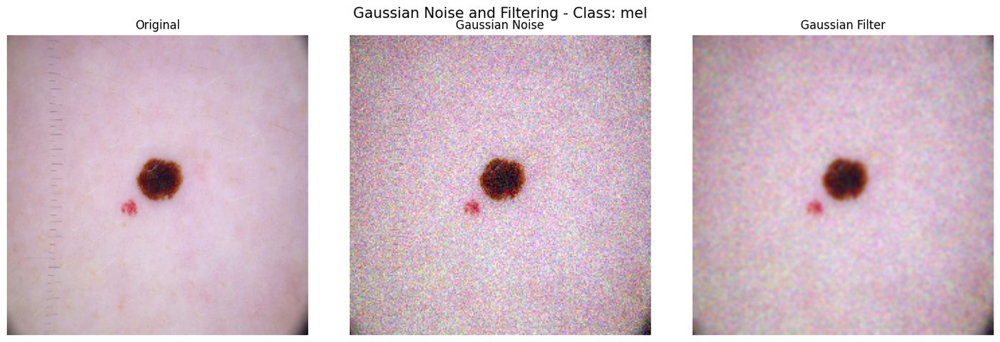

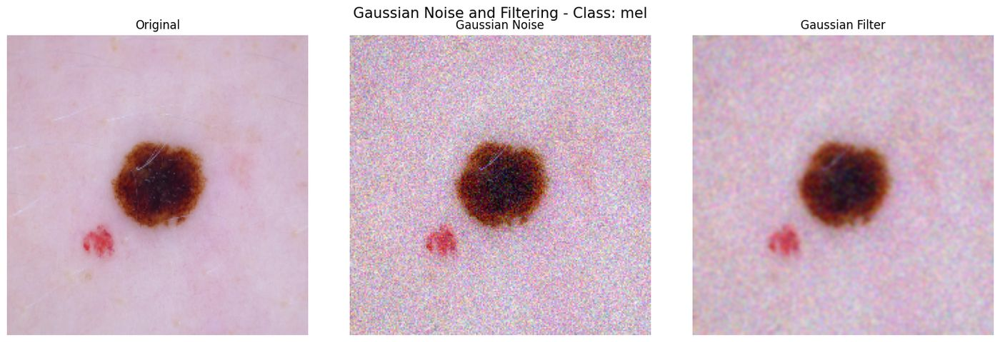

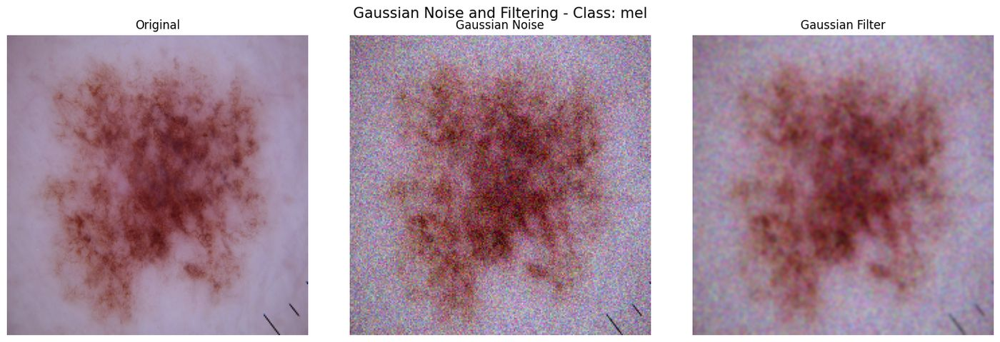

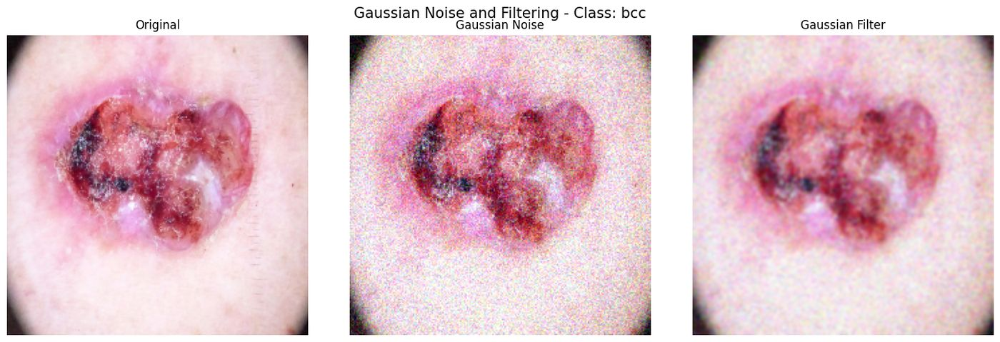

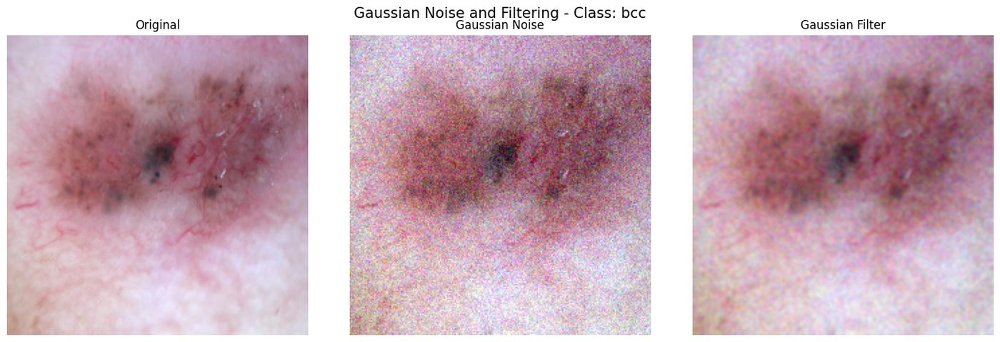

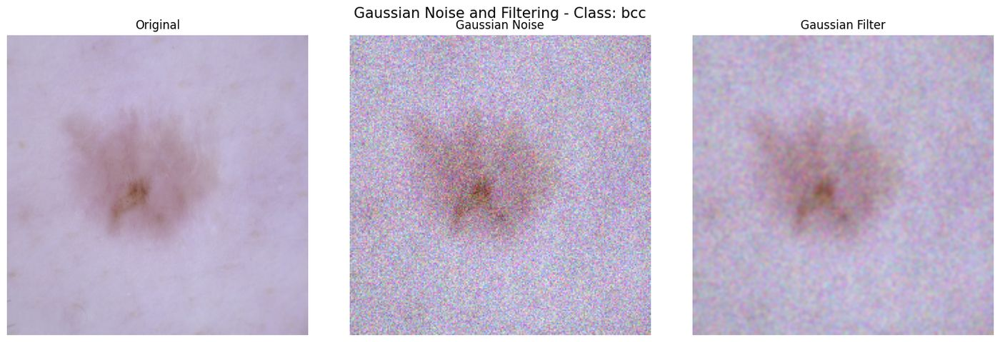

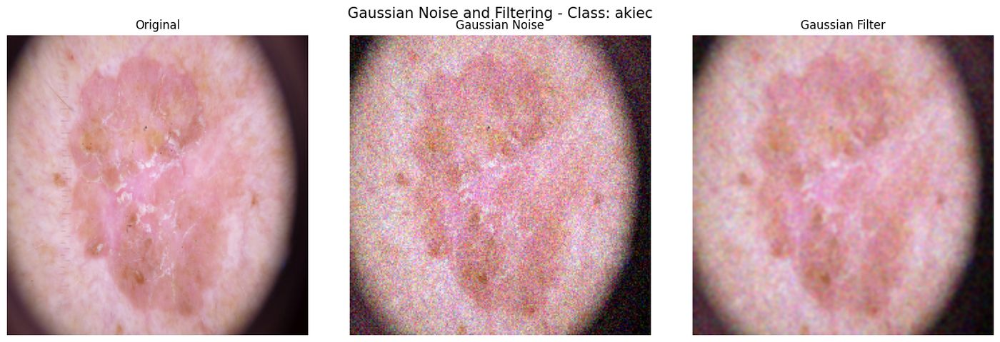

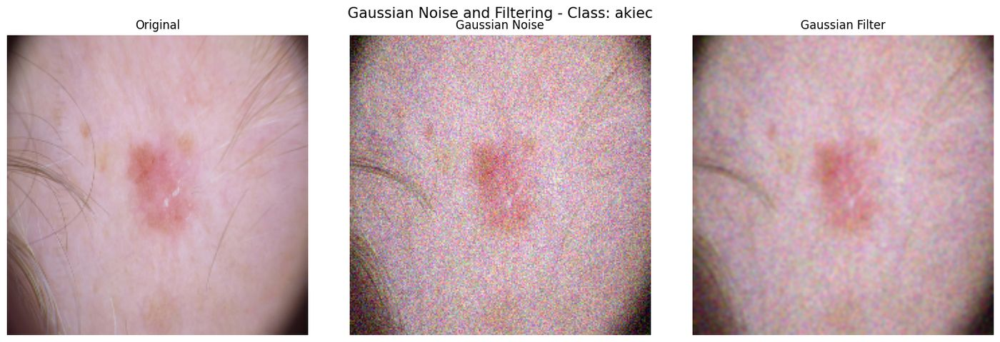

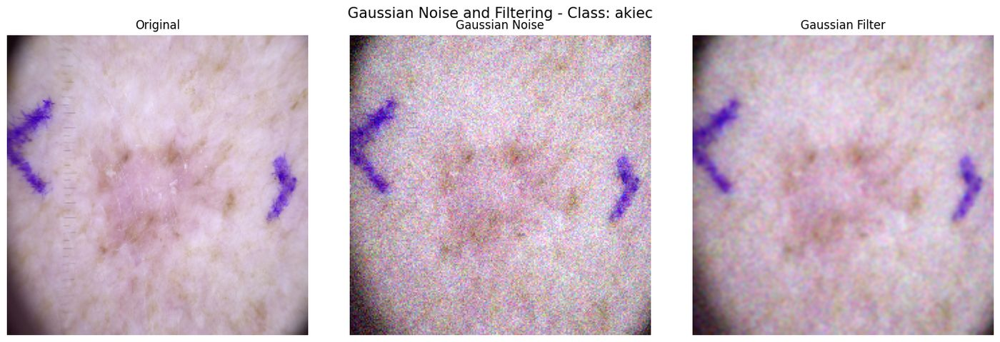

In [86]:
# ============================================
# STEP 5: GAUSSIAN NOISE COMPARISON
# ============================================

for item in images:

    original = item["image"]
    noisy = item["gaussian_noisy"]
    filtered = item["gaussian_filtered"]

    class_name = item["class"]

    plt.figure(figsize=(15, 5))

    # Original
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    # Gaussian noise
    plt.subplot(1, 3, 2)
    plt.imshow(noisy)
    plt.title("Gaussian Noise")
    plt.axis("off")

    # Gaussian filtered
    plt.subplot(1, 3, 3)
    plt.imshow(filtered)
    plt.title("Gaussian Filter")
    plt.axis("off")

    plt.suptitle(
        f"Gaussian Noise and Filtering - Class: {class_name}",
        fontsize=15
    )

    plt.tight_layout()
    plt.show()

Display Salt-and-Pepper Results

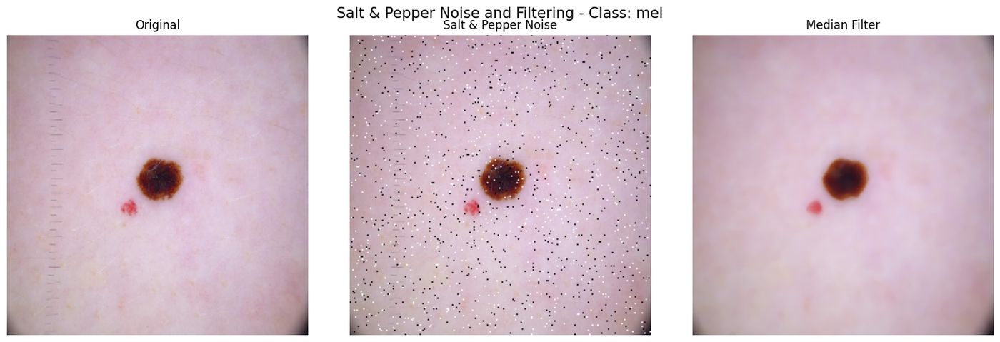

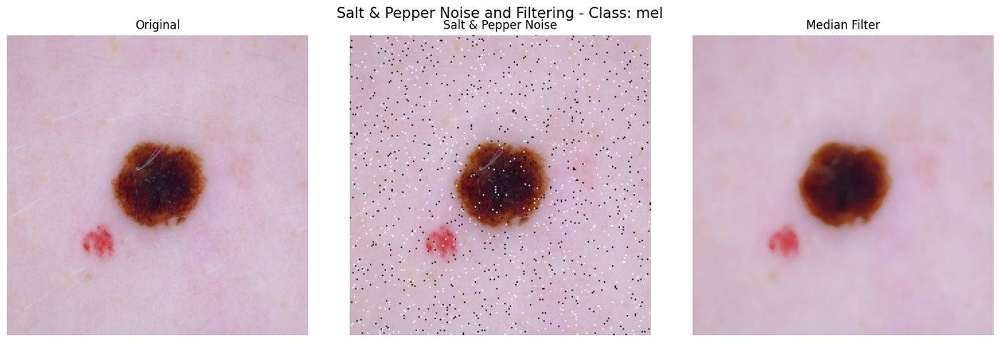

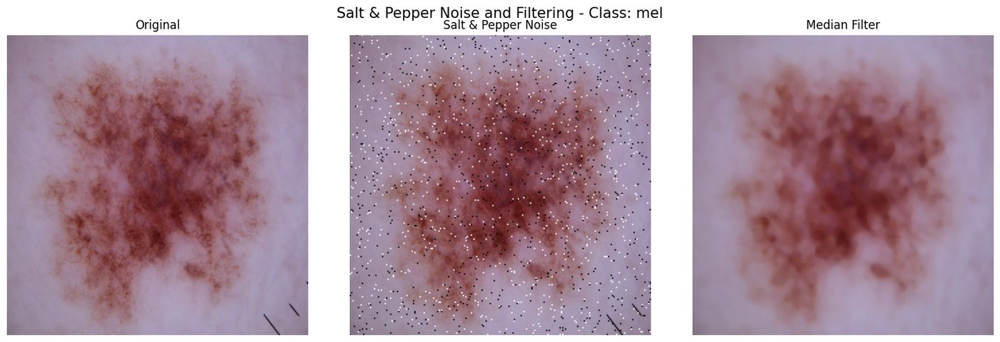

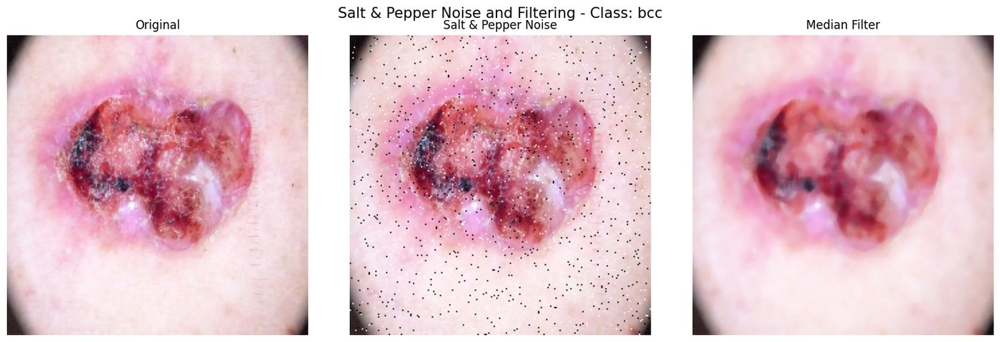

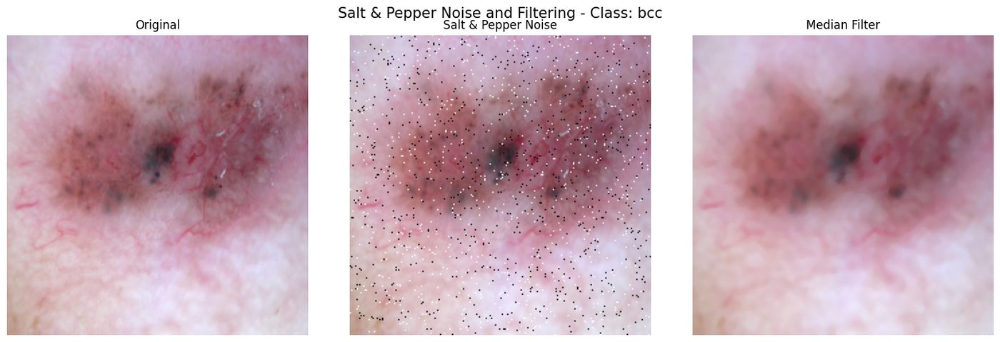

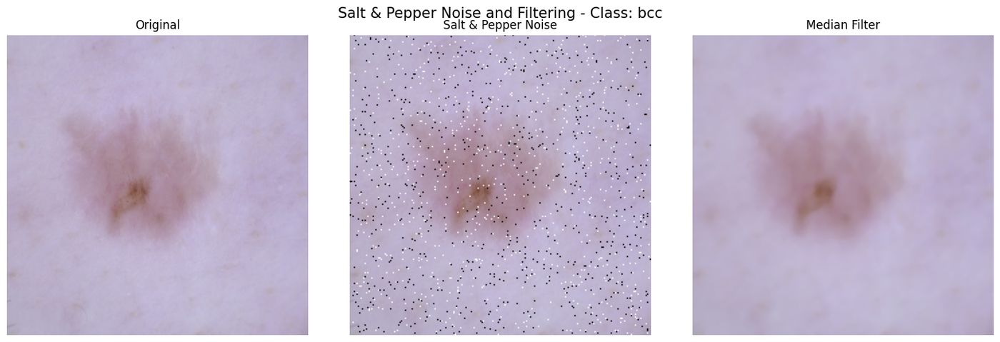

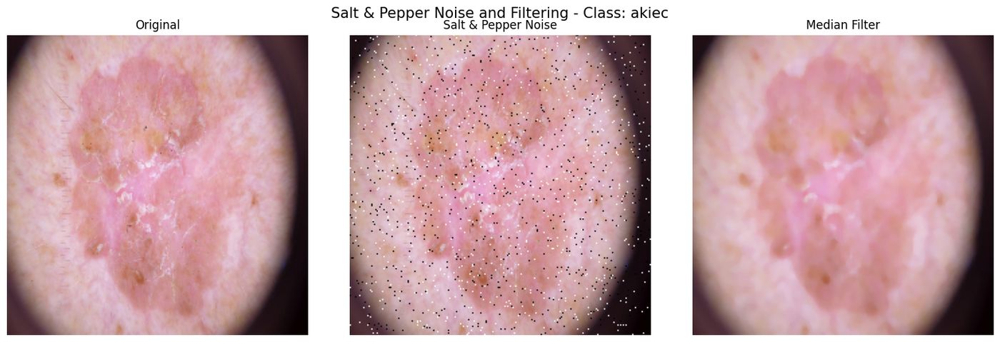

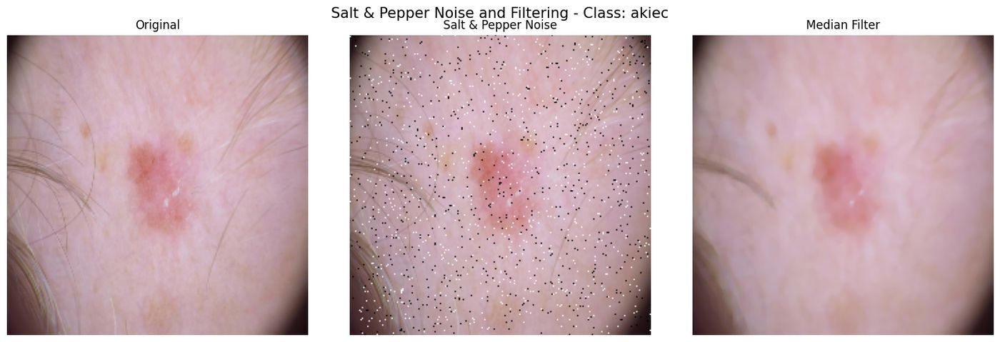

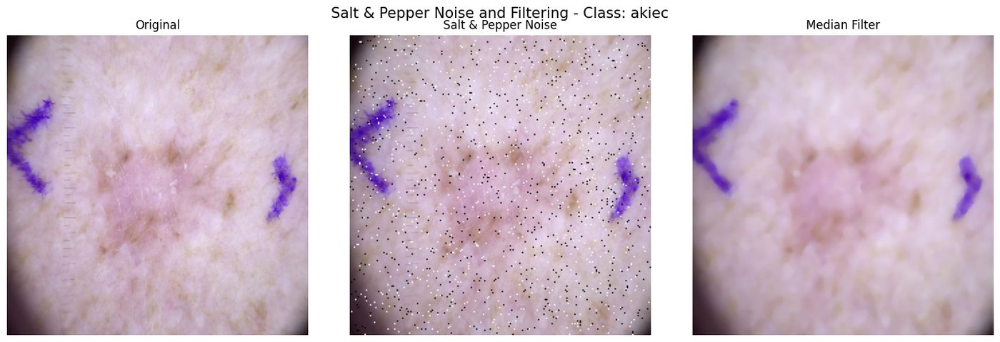

In [87]:
# ============================================
# STEP 6: SALT & PEPPER COMPARISON
# ============================================

for item in images:

    original = item["image"]
    noisy = item["salt_pepper_noisy"]
    filtered = item["median_filtered"]

    class_name = item["class"]

    plt.figure(figsize=(15, 5))

    # Original
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    # Salt & Pepper noise
    plt.subplot(1, 3, 2)
    plt.imshow(noisy)
    plt.title("Salt & Pepper Noise")
    plt.axis("off")

    # Median filter
    plt.subplot(1, 3, 3)
    plt.imshow(filtered)
    plt.title("Median Filter")
    plt.axis("off")

    plt.suptitle(
        f"Salt & Pepper Noise and Filtering - Class: {class_name}",
        fontsize=15
    )

    plt.tight_layout()
    plt.show()

Apply Edge Detection to Noisy Images

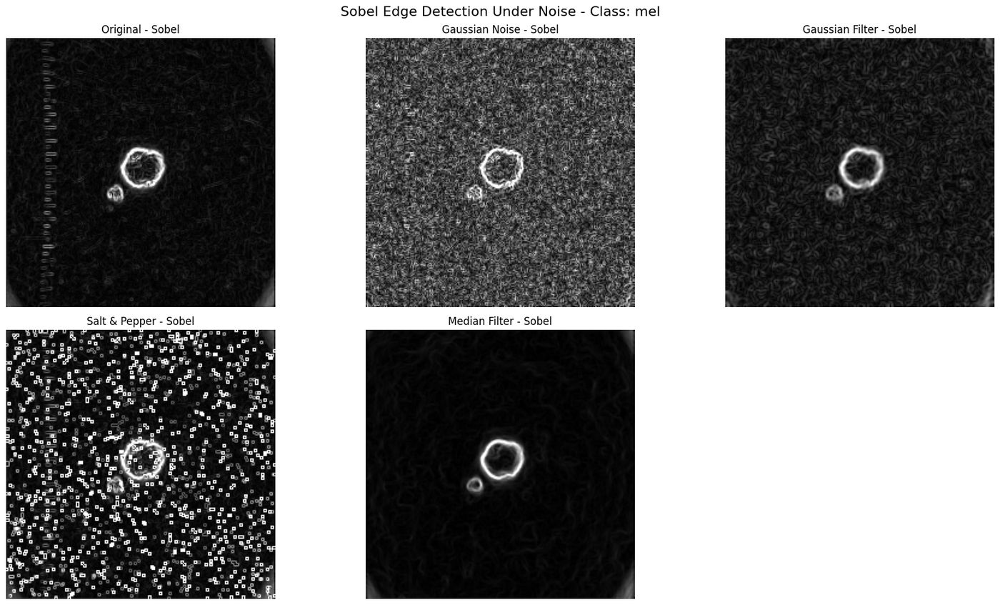

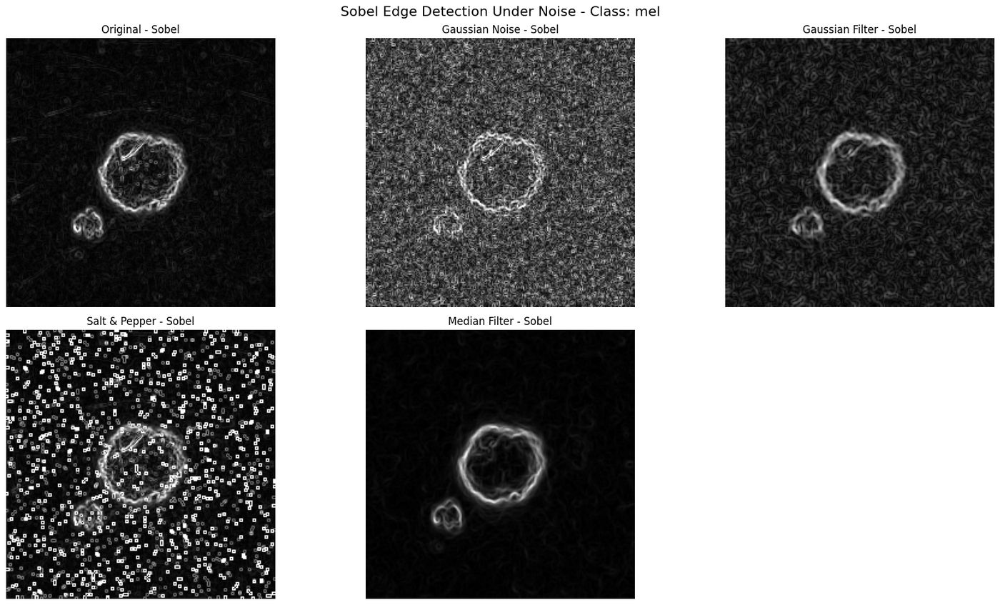

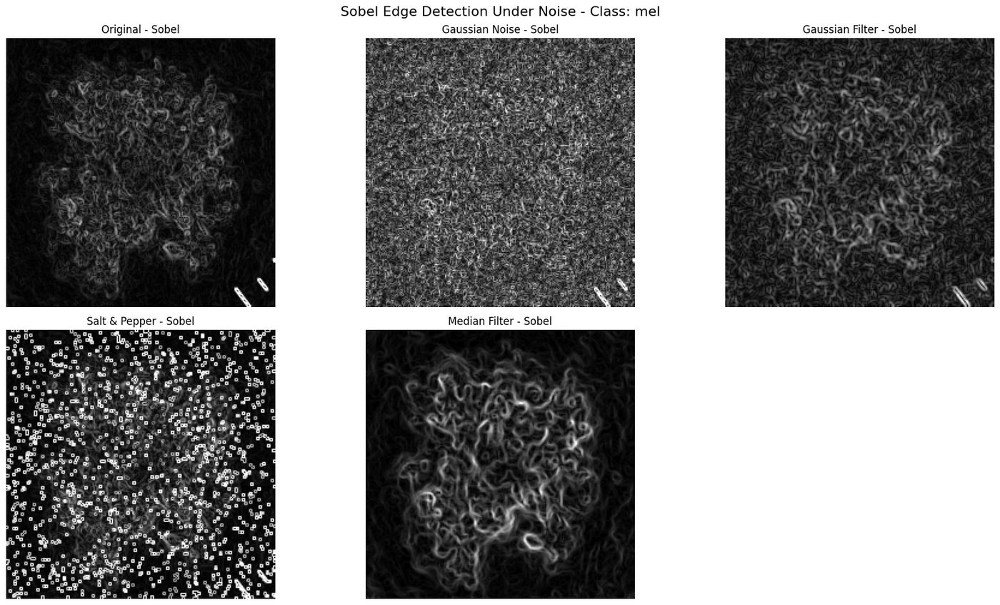

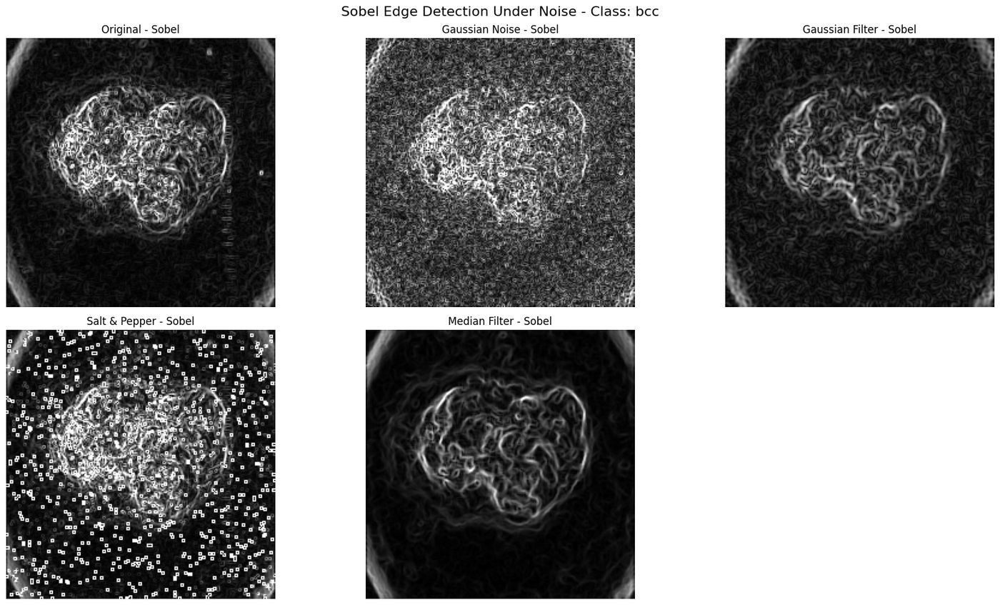

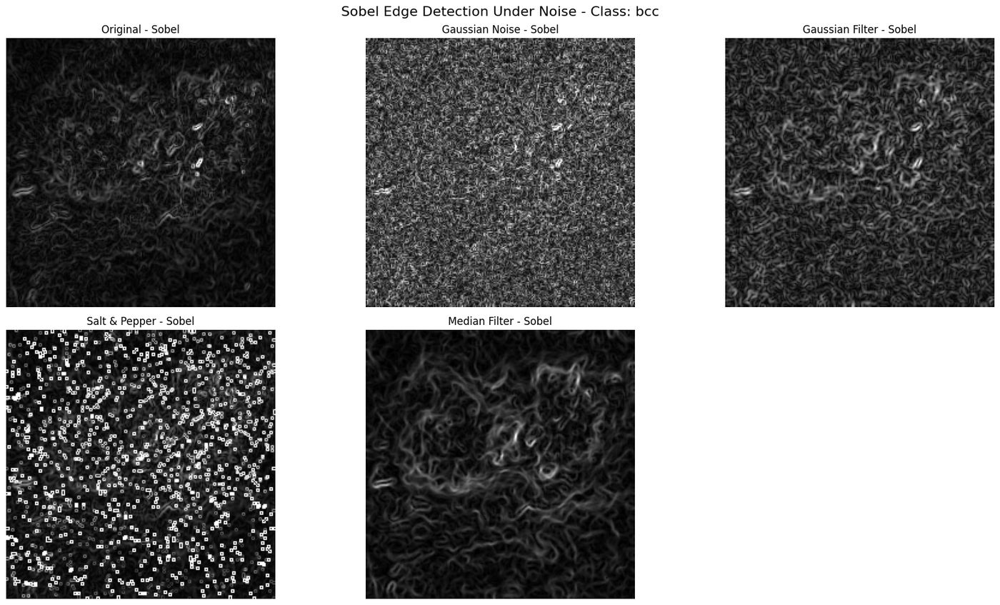

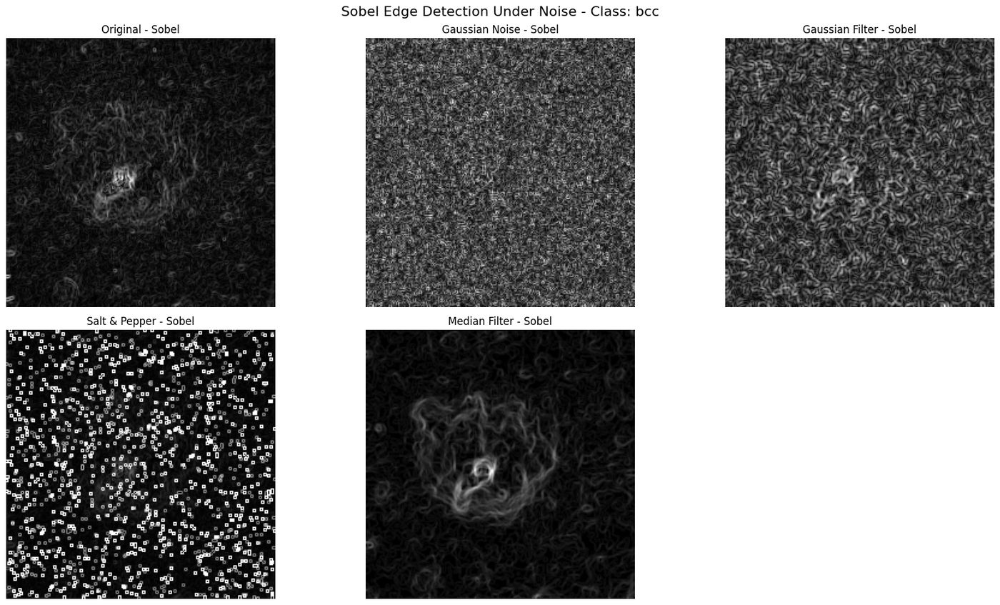

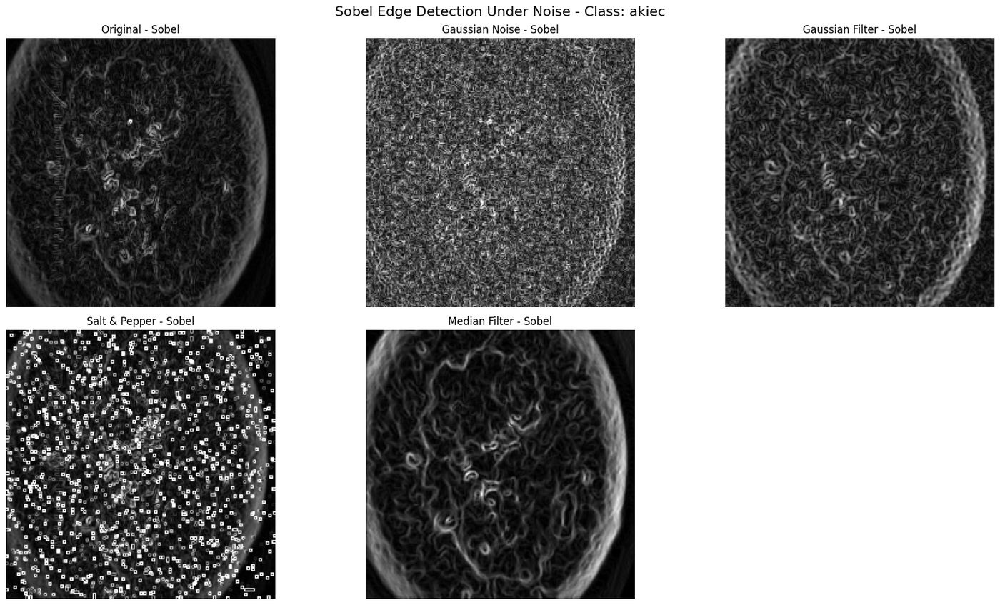

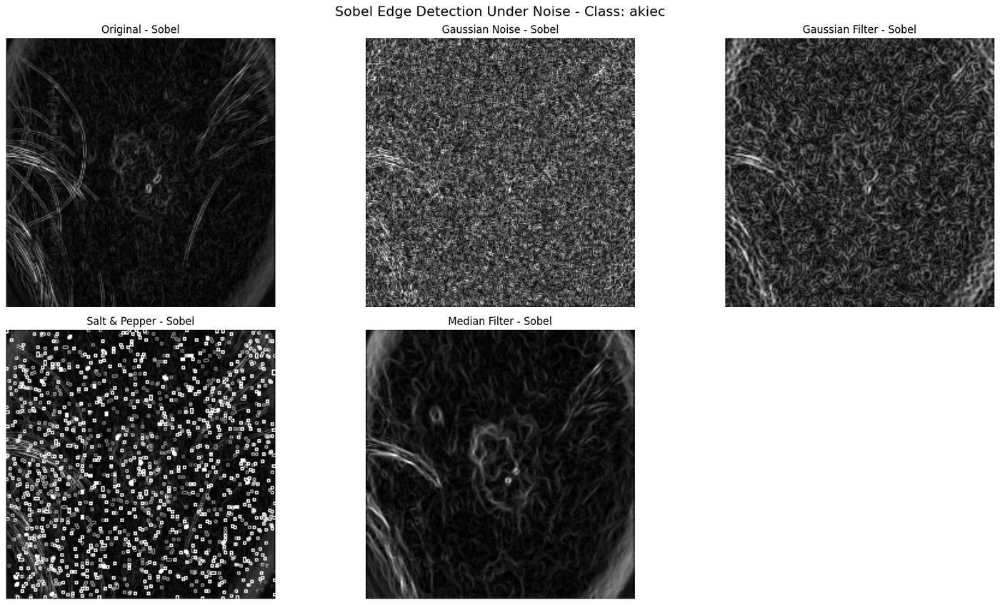

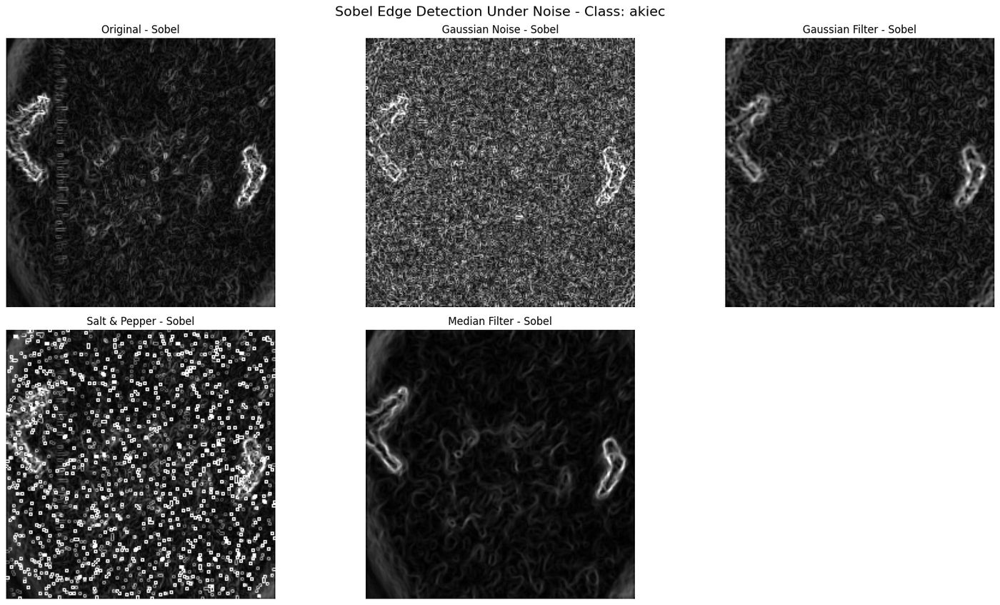

In [88]:
for item in images:

    original = item["image"]

    gaussian_noisy = item["gaussian_noisy"]

    gaussian_filtered = item["gaussian_filtered"]

    salt_pepper_noisy = item["salt_pepper_noisy"]

    median_filtered = item["median_filtered"]

    # Edge detection
    original_edges = edge_detection(
        original
    )["sobel_magnitude"]

    gaussian_edges = edge_detection(
        gaussian_noisy
    )["sobel_magnitude"]

    gaussian_filtered_edges = edge_detection(
        gaussian_filtered
    )["sobel_magnitude"]

    salt_pepper_edges = edge_detection(
        salt_pepper_noisy
    )["sobel_magnitude"]

    median_edges = edge_detection(
        median_filtered
    )["sobel_magnitude"]

    # Display
    plt.figure(figsize=(18, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(original_edges, cmap="gray")
    plt.title("Original - Sobel")
    plt.axis("off")

    plt.subplot(2, 3, 2)
    plt.imshow(gaussian_edges, cmap="gray")
    plt.title("Gaussian Noise - Sobel")
    plt.axis("off")

    plt.subplot(2, 3, 3)
    plt.imshow(gaussian_filtered_edges, cmap="gray")
    plt.title("Gaussian Filter - Sobel")
    plt.axis("off")

    plt.subplot(2, 3, 4)
    plt.imshow(salt_pepper_edges, cmap="gray")
    plt.title("Salt & Pepper - Sobel")
    plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(median_edges, cmap="gray")
    plt.title("Median Filter - Sobel")
    plt.axis("off")

    plt.suptitle(
        f"Sobel Edge Detection Under Noise - Class: {item['class']}",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

Compare Prewitt, Laplacian and LoG

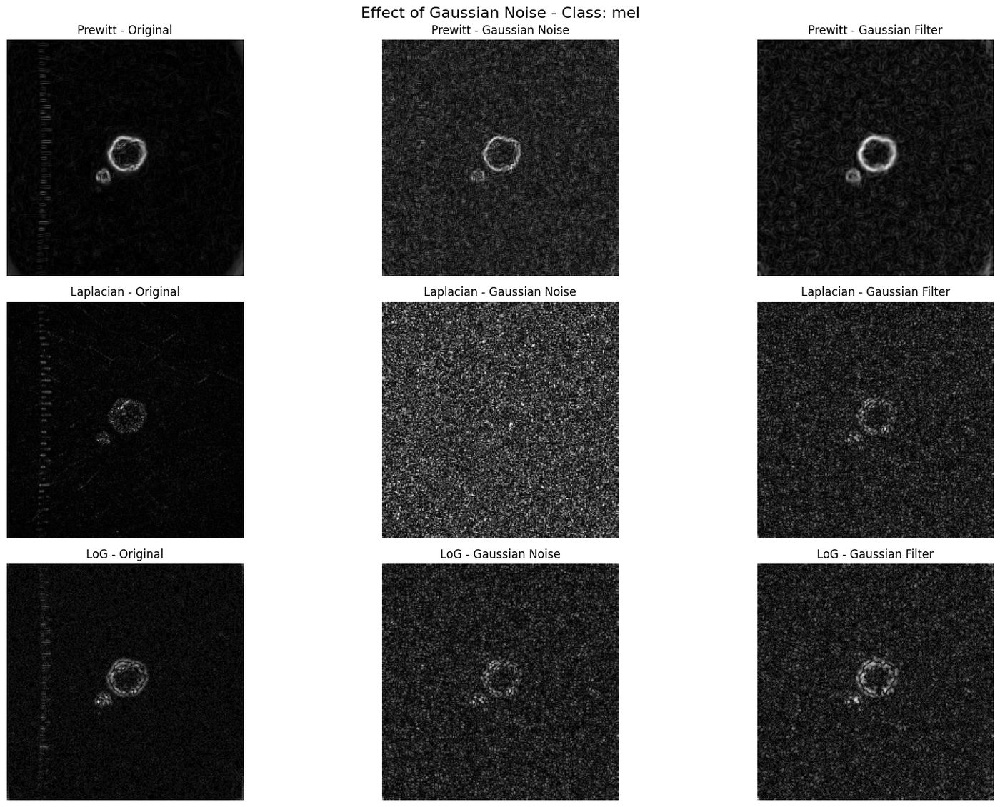

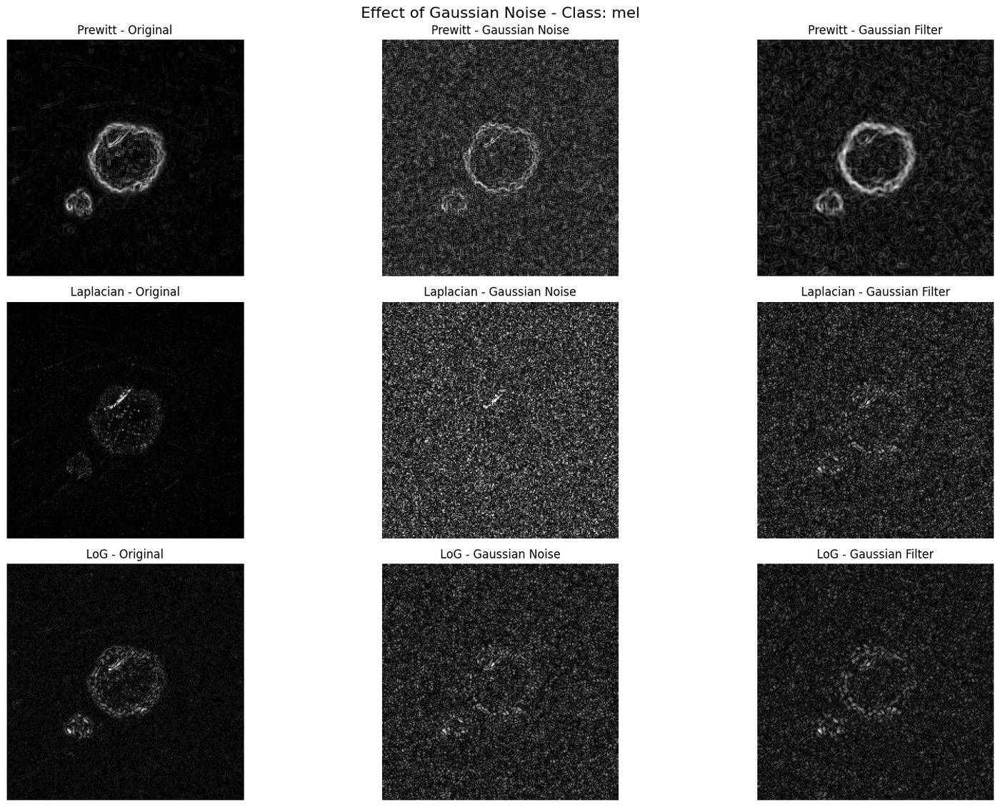

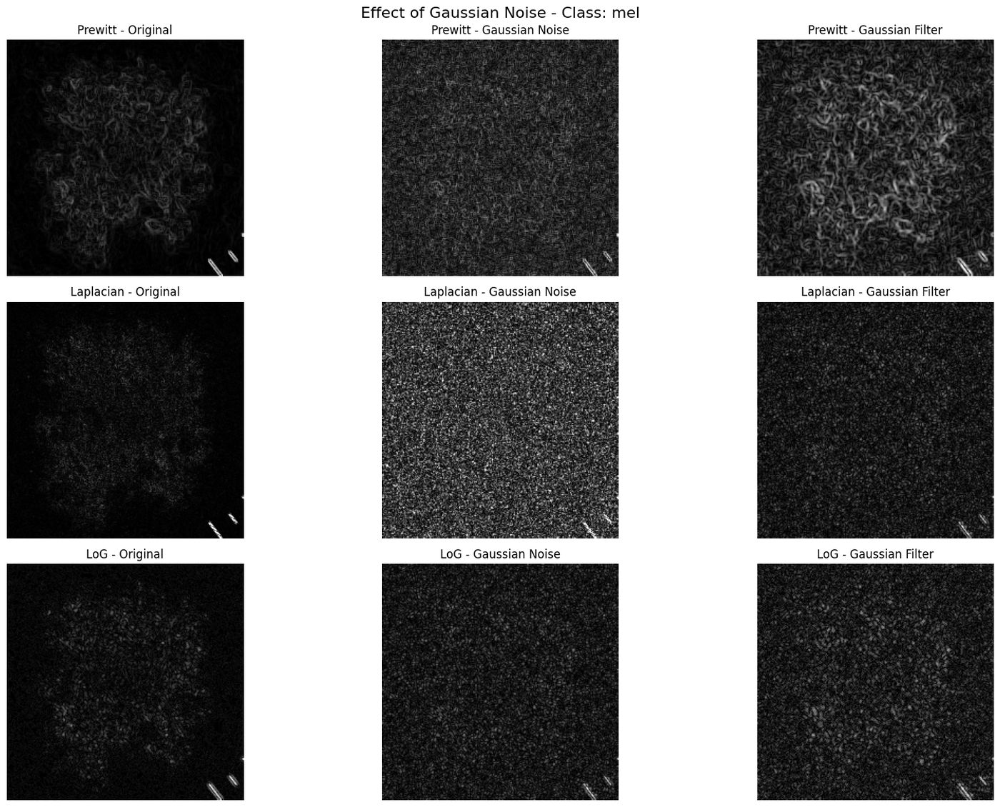

In [89]:
for item in images[:3]:

    original = item["image"]
    gaussian_noisy = item["gaussian_noisy"]
    gaussian_filtered = item["gaussian_filtered"]

    # Original
    original_result = edge_detection(
        original
    )

    # Gaussian noisy
    noisy_result = edge_detection(
        gaussian_noisy
    )

    # Gaussian filtered
    filtered_result = edge_detection(
        gaussian_filtered
    )

    plt.figure(figsize=(18, 12))

    # -------------------------
    # PREWITT
    # -------------------------

    plt.subplot(3, 3, 1)
    plt.imshow(
        original_result["prewitt"],
        cmap="gray"
    )
    plt.title("Prewitt - Original")
    plt.axis("off")

    plt.subplot(3, 3, 2)
    plt.imshow(
        noisy_result["prewitt"],
        cmap="gray"
    )
    plt.title("Prewitt - Gaussian Noise")
    plt.axis("off")

    plt.subplot(3, 3, 3)
    plt.imshow(
        filtered_result["prewitt"],
        cmap="gray"
    )
    plt.title("Prewitt - Gaussian Filter")
    plt.axis("off")

    # -------------------------
    # LAPLACIAN
    # -------------------------

    plt.subplot(3, 3, 4)
    plt.imshow(
        original_result["laplacian"],
        cmap="gray"
    )
    plt.title("Laplacian - Original")
    plt.axis("off")

    plt.subplot(3, 3, 5)
    plt.imshow(
        noisy_result["laplacian"],
        cmap="gray"
    )
    plt.title("Laplacian - Gaussian Noise")
    plt.axis("off")

    plt.subplot(3, 3, 6)
    plt.imshow(
        filtered_result["laplacian"],
        cmap="gray"
    )
    plt.title("Laplacian - Gaussian Filter")
    plt.axis("off")

    # -------------------------
    # LoG
    # -------------------------

    plt.subplot(3, 3, 7)
    plt.imshow(
        original_result["log"],
        cmap="gray"
    )
    plt.title("LoG - Original")
    plt.axis("off")

    plt.subplot(3, 3, 8)
    plt.imshow(
        noisy_result["log"],
        cmap="gray"
    )
    plt.title("LoG - Gaussian Noise")
    plt.axis("off")

    plt.subplot(3, 3, 9)
    plt.imshow(
        filtered_result["log"],
        cmap="gray"
    )
    plt.title("LoG - Gaussian Filter")
    plt.axis("off")

    plt.suptitle(
        f"Effect of Gaussian Noise - Class: {item['class']}",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

Compare Canny

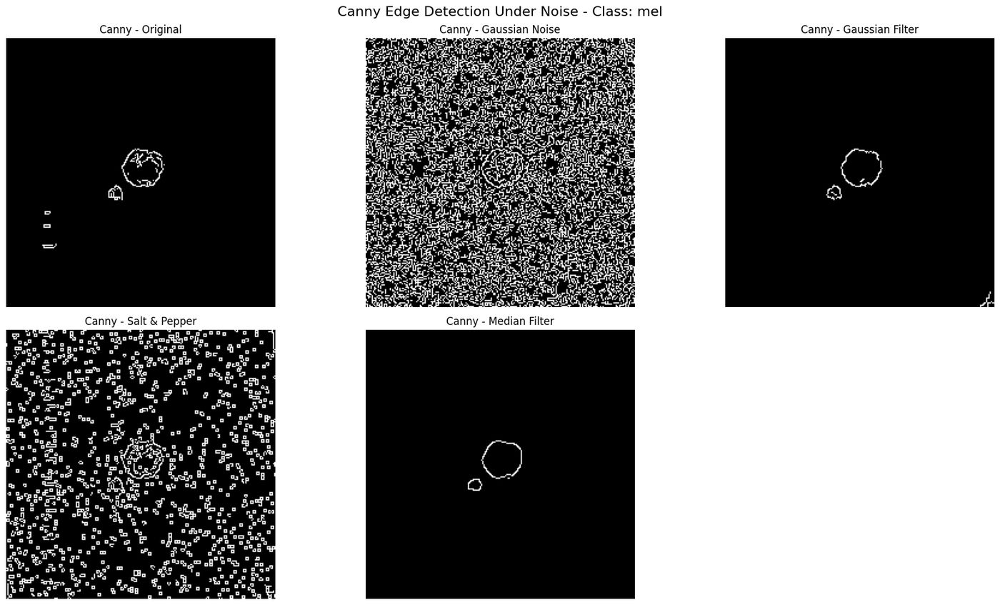

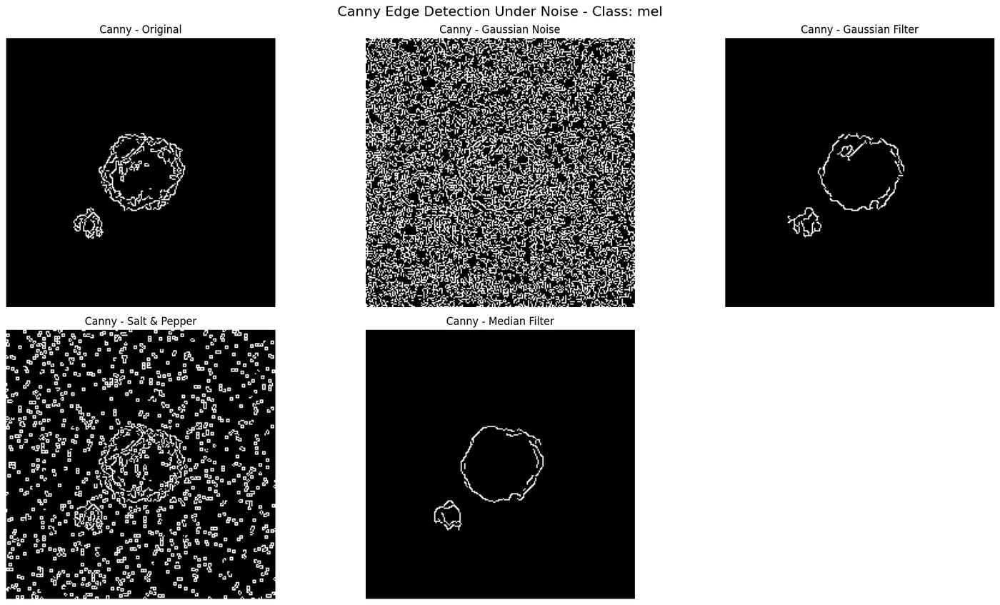

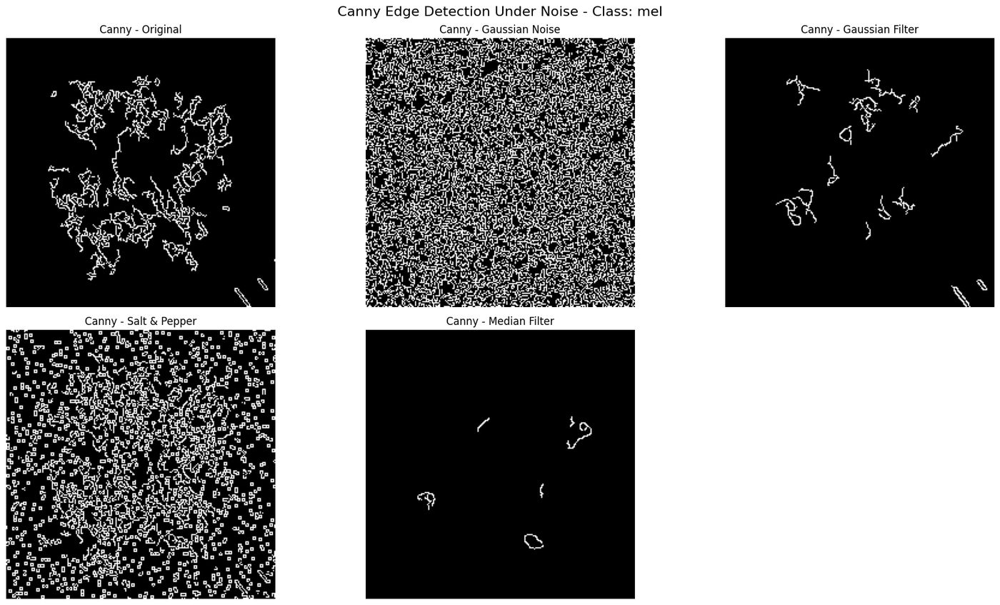

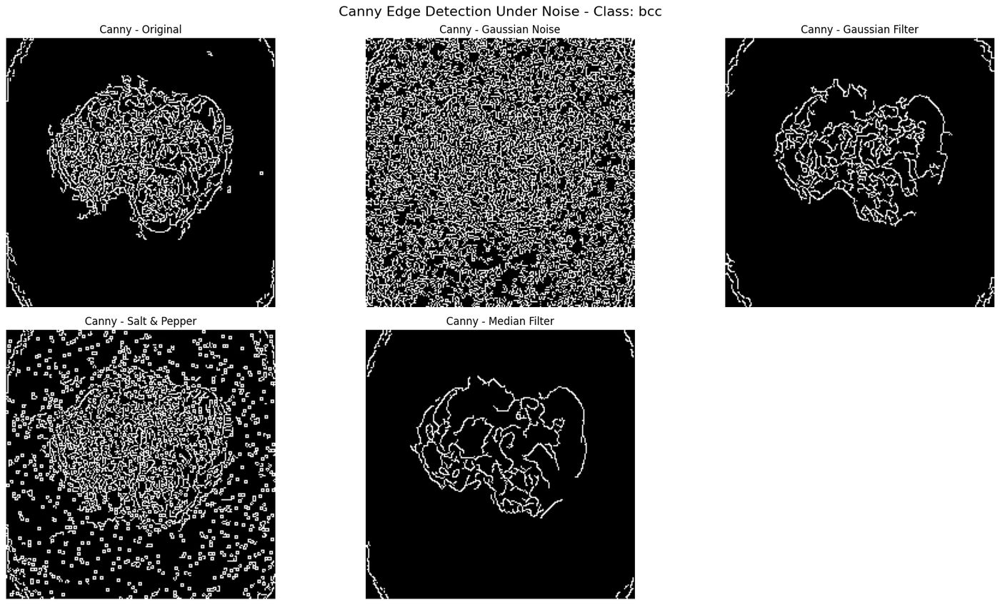

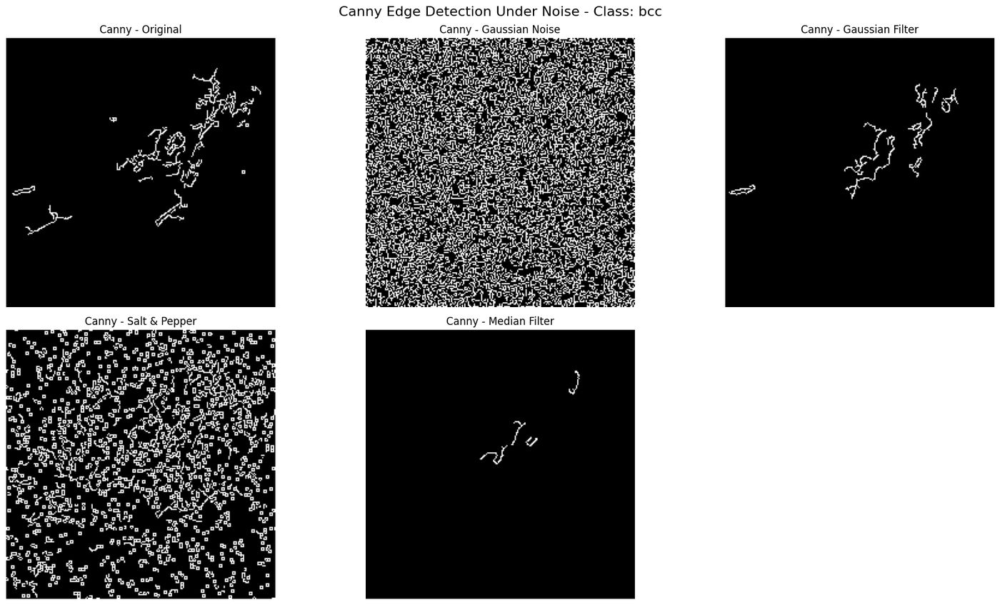

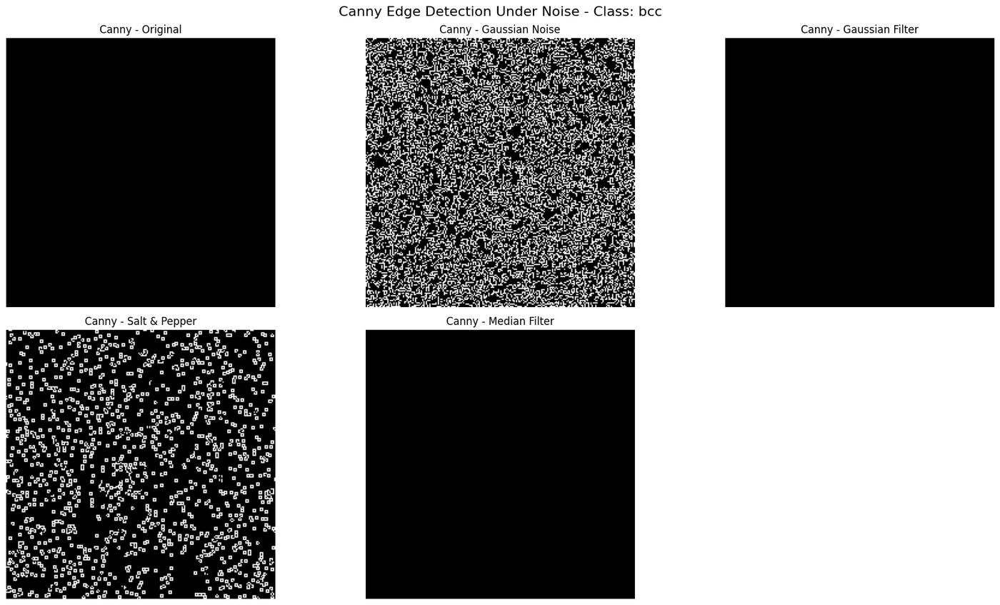

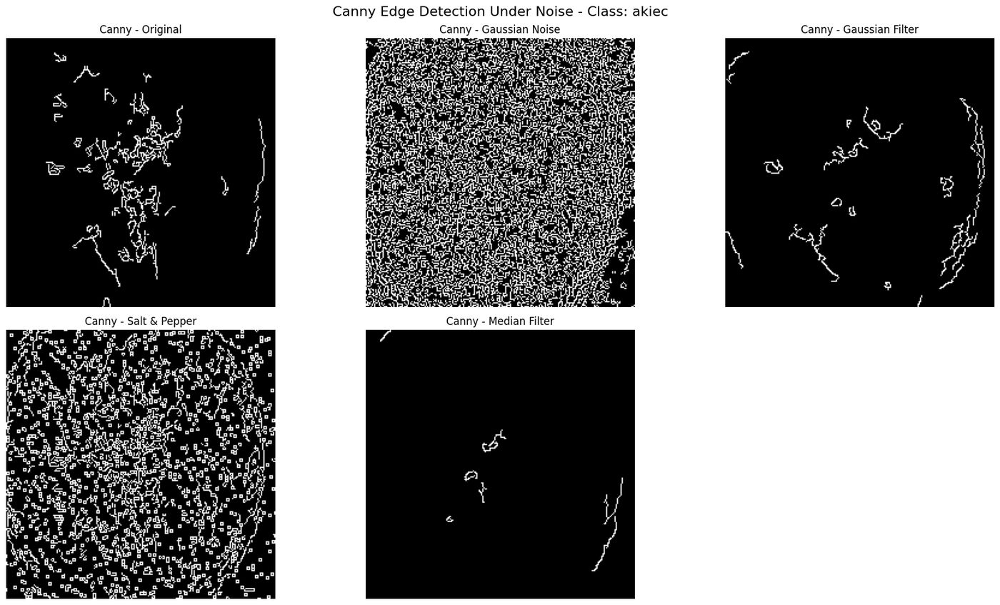

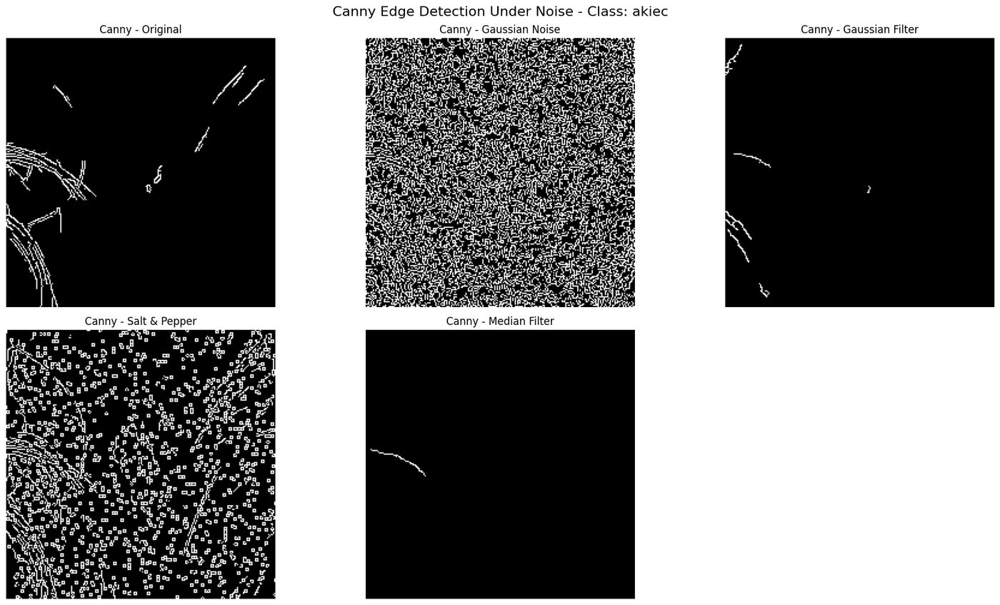

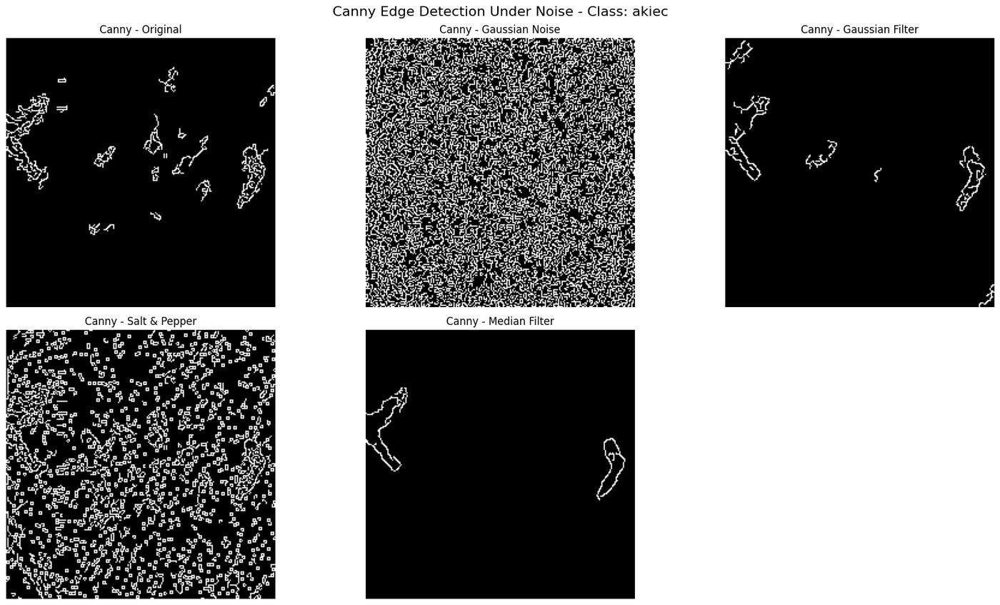

In [90]:
for item in images:

    original = item["image"]

    gaussian_noisy = item["gaussian_noisy"]

    gaussian_filtered = item["gaussian_filtered"]

    salt_pepper_noisy = item["salt_pepper_noisy"]

    median_filtered = item["median_filtered"]

    # Canny
    original_canny = edge_detection(
        original
    )["canny"]

    gaussian_canny = edge_detection(
        gaussian_noisy
    )["canny"]

    gaussian_filtered_canny = edge_detection(
        gaussian_filtered
    )["canny"]

    salt_pepper_canny = edge_detection(
        salt_pepper_noisy
    )["canny"]

    median_canny = edge_detection(
        median_filtered
    )["canny"]

    plt.figure(figsize=(18, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(
        original_canny,
        cmap="gray"
    )
    plt.title("Canny - Original")
    plt.axis("off")

    plt.subplot(2, 3, 2)
    plt.imshow(
        gaussian_canny,
        cmap="gray"
    )
    plt.title("Canny - Gaussian Noise")
    plt.axis("off")

    plt.subplot(2, 3, 3)
    plt.imshow(
        gaussian_filtered_canny,
        cmap="gray"
    )
    plt.title("Canny - Gaussian Filter")
    plt.axis("off")

    plt.subplot(2, 3, 4)
    plt.imshow(
        salt_pepper_canny,
        cmap="gray"
    )
    plt.title("Canny - Salt & Pepper")
    plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(
        median_canny,
        cmap="gray"
    )
    plt.title("Canny - Median Filter")
    plt.axis("off")

    plt.suptitle(
        f"Canny Edge Detection Under Noise - Class: {item['class']}",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

Fill Table 1

In [91]:
table1 = pd.DataFrame({

    "Edge Detector": [
        "Sobel",
        "Sobel",
        "Sobel",
        "Sobel",
        "Sobel",
        "Prewitt",
        "Laplacian",
        "LoG",
        "Canny",
        "Canny",
        "Canny"
    ],

    "Input Image": [
        "Original",
        "Noisy",
        "Noisy",
        "Noisy",
        "Noisy",
        "Original",
        "Original",
        "Noisy",
        "Original",
        "Noisy",
        "Noisy"
    ],

    "Noise Type": [
        "None",
        "Gaussian",
        "Salt & Pepper",
        "Gaussian",
        "Salt & Pepper",
        "None",
        "None",
        "Gaussian",
        "None",
        "Gaussian",
        "Salt & Pepper"
    ],

    "Preprocessing": [
        "None",
        "None",
        "None",
        "Gaussian Filter",
        "Median Filter",
        "None",
        "None",
        "Gaussian Filter",
        "Built-in smoothing",
        "Gaussian Filter",
        "Median Filter"
    ],

    "Edge Quality": [
        "Clear",
        "Reduced",
        "Reduced",
        "Improved",
        "Improved",
        "Clear",
        "Clear",
        "Improved",
        "Clear",
        "Improved",
        "Improved"
    ],

    "Noise Sensitivity": [
        "Low",
        "High",
        "High",
        "Reduced",
        "Reduced",
        "Moderate",
        "High",
        "Reduced",
        "Low",
        "Reduced",
        "Reduced"
    ],

    "Observations": [
        "Edges are clear and continuous.",
        "Noise produces additional false edges.",
        "Noise creates many unwanted edge points.",
        "Gaussian filtering reduces false edges and improves continuity.",
        "Median filtering removes impulse noise and improves edges.",
        "Edges are visible with reasonable continuity.",
        "Detects fine edges but is strongly affected by noise.",
        "Gaussian smoothing before LoG reduces unwanted edges.",
        "Canny produces thin and clear edges.",
        "Gaussian noise introduces extra edges.",
        "Median filtering reduces salt-and-pepper noise and improves edge continuity."
    ]
})

display(table1)

,Edge Detector,Input Image,Noise Type,Preprocessing,Edge Quality,Noise Sensitivity,Observations
0,Sobel,Original,None,None,Clear,Low,Edges are clear and continuous.
1,Sobel,Noisy,Gaussian,None,Reduced,High,Noise produces additional false edges.
2,Sobel,Noisy,Salt & Pepper,None,Reduced,High,Noise creates many unwanted edge points.
3,Sobel,Noisy,Gaussian,Gaussian Filter,Improved,Reduced,Gaussian filtering reduces false edges and imp...
4,Sobel,Noisy,Salt & Pepper,Median Filter,Improved,Reduced,Median filtering removes impulse noise and imp...
5,Prewitt,Original,None,None,Clear,Moderate,Edges are visible with reasonable continuity.
6,Laplacian,Original,None,None,Clear,High,Detects fine edges but is strongly affected by...
7,LoG,Noisy,Gaussian,Gaussian Filter,Improved,Reduced,Gaussian smoothing before LoG reduces unwanted...
8,Canny,Original,None,Built-in smoothing,Clear,Low,Canny produces thin and clear edges.
9,Canny,Noisy,Gaussian,Gaussian Filter,Improved,Reduced,Gaussian noise introduces extra edges.


Task 3: Parameter Analysis of Canny Edge Detection

Create Canny function

In [92]:
def apply_canny(image, low_threshold, high_threshold, kernel_size=3):

    # Convert RGB image to grayscale
    gray = cv2.cvtColor(
        image,
        cv2.COLOR_RGB2GRAY
    )

    # Gaussian smoothing
    if kernel_size == 5:
        gray = cv2.GaussianBlur(
            gray,
            (5, 5),
            0
        )
    else:
        gray = cv2.GaussianBlur(
            gray,
            (3, 3),
            0
        )

    # Canny edge detection
    edges = cv2.Canny(
        gray,
        low_threshold,
        high_threshold,
        apertureSize=kernel_size
    )

    return edges

Define the four configurations

In [93]:
canny_configs = {

    "Canny-1": {
        "low": 30,
        "high": 100,
        "kernel": 3
    },

    "Canny-2": {
        "low": 50,
        "high": 150,
        "kernel": 3
    },

    "Canny-3": {
        "low": 100,
        "high": 200,
        "kernel": 3
    },

    "Canny-4": {
        "low": 50,
        "high": 150,
        "kernel": 5
    }
}

print("Canny configurations created.")

Canny configurations created.


Select representative images

In [94]:
representative_images = []

for class_name in SELECTED_CLASSES:

    for item in images:

        if item["class"] == class_name:

            representative_images.append(item)
            break

print(
    "Number of representative images:",
    len(representative_images)
)

Number of representative images: 3


Apply all four Canny configurations

In [95]:
for item in representative_images:

    image_id = item["image_id"]
    class_name = item["class"]
    image = item["image"]

    canny_results[image_id] = {}

    for config_name, config in canny_configs.items():

        edges = apply_canny(
            image,
            config["low"],
            config["high"],
            config["kernel"]
        )

        canny_results[image_id][config_name] = edges

print("All Canny configurations applied.")

All Canny configurations applied.


Display the comparison

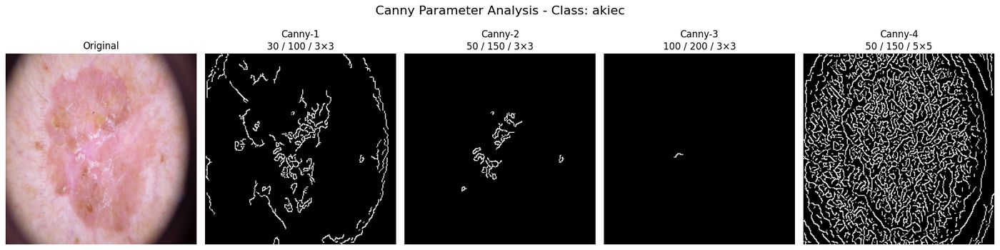

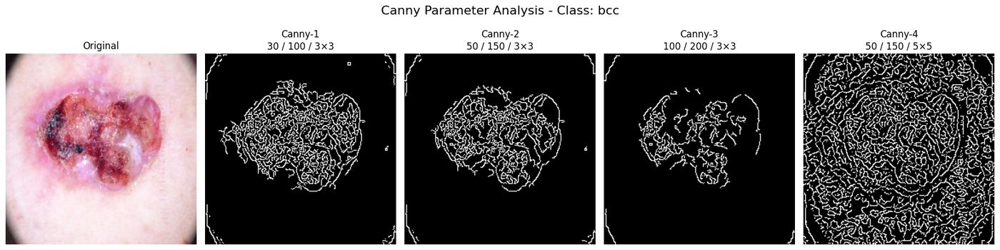

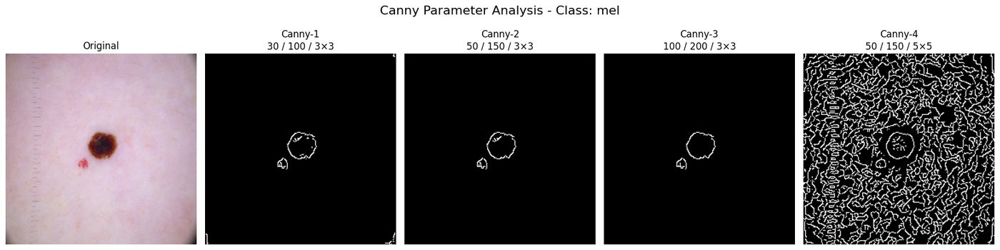

In [96]:
for item in representative_images:

    image_id = item["image_id"]
    class_name = item["class"]

    plt.figure(figsize=(18, 5))

    # Original
    plt.subplot(1, 5, 1)

    plt.imshow(item["image"])

    plt.title("Original")

    plt.axis("off")

    # Canny-1
    plt.subplot(1, 5, 2)

    plt.imshow(
        canny_results[image_id]["Canny-1"],
        cmap="gray"
    )

    plt.title(
        "Canny-1\n30 / 100 / 3×3"
    )

    plt.axis("off")

    # Canny-2
    plt.subplot(1, 5, 3)

    plt.imshow(
        canny_results[image_id]["Canny-2"],
        cmap="gray"
    )

    plt.title(
        "Canny-2\n50 / 150 / 3×3"
    )

    plt.axis("off")

    # Canny-3
    plt.subplot(1, 5, 4)

    plt.imshow(
        canny_results[image_id]["Canny-3"],
        cmap="gray"
    )

    plt.title(
        "Canny-3\n100 / 200 / 3×3"
    )

    plt.axis("off")

    # Canny-4
    plt.subplot(1, 5, 5)

    plt.imshow(
        canny_results[image_id]["Canny-4"],
        cmap="gray"
    )

    plt.title(
        "Canny-4\n50 / 150 / 5×5"
    )

    plt.axis("off")

    plt.suptitle(
        f"Canny Parameter Analysis - Class: {class_name}",
        fontsize=16
    )

    plt.tight_layout()

    plt.show()

Calculate number of detected edges

In [97]:
edge_counts = []

for item in representative_images:

    image_id = item["image_id"]
    class_name = item["class"]

    for config_name in canny_configs:

        edges = canny_results[
            image_id
        ][config_name]

        # Count white edge pixels
        number_of_edges = np.count_nonzero(
            edges
        )

        edge_counts.append({

            "Class": class_name,

            "Configuration": config_name,

            "Number of Detected Edges":
                number_of_edges
        })

edge_count_df = pd.DataFrame(
    edge_counts
)

display(edge_count_df)

,Class,Configuration,Number of Detected Edges
0,akiec,Canny-1,2282
1,akiec,Canny-2,452
2,akiec,Canny-3,16
3,akiec,Canny-4,10830
4,bcc,Canny-1,4630
5,bcc,Canny-2,3596
6,bcc,Canny-3,2035
7,bcc,Canny-4,11504
8,mel,Canny-1,256
9,mel,Canny-2,199


Calculate average number of edges

In [98]:
average_edges = (
    edge_count_df
    .groupby("Configuration")[
        "Number of Detected Edges"
    ]
    .mean()
    .reset_index()
)

average_edges.columns = [
    "Configuration",
    "Average Number of Detected Edges"
]

display(average_edges)

,Configuration,Average Number of Detected Edges
0,Canny-1,2389.333333
1,Canny-2,1415.666667
2,Canny-3,742.000000
3,Canny-4,11151.000000


Make Table 2

In [99]:
table2 = pd.DataFrame({

    "Configuration": [
        "Canny-1",
        "Canny-2",
        "Canny-3",
        "Canny-4"
    ],

    "Low Threshold": [
        30,
        50,
        100,
        50
    ],

    "High Threshold": [
        100,
        150,
        200,
        150
    ],

    "Kernel Size": [
        "3×3",
        "3×3",
        "3×3",
        "5×5"
    ]
})

# Add average edge count
table2 = table2.merge(
    average_edges,
    on="Configuration"
)

display(table2)

,Configuration,Low Threshold,High Threshold,Kernel Size,Average Number of Detected Edges
0,Canny-1,30,100,3×3,2389.333333
1,Canny-2,50,150,3×3,1415.666667
2,Canny-3,100,200,3×3,742.000000
3,Canny-4,50,150,5×5,11151.000000


Add observations

In [100]:
observations = {

    "Canny-1":
        "Lower thresholds detect more weak edges and may include extra edges.",

    "Canny-2":
        "Medium thresholds provide a balanced edge representation.",

    "Canny-3":
        "Higher thresholds detect stronger edges and may remove weaker edges.",

    "Canny-4":
        "Larger Gaussian kernel provides more smoothing before edge detection."
}

table2["Observation"] = table2[
    "Configuration"
].map(observations)

display(table2)

,Configuration,Low Threshold,High Threshold,Kernel Size,Average Number of Detected Edges,Observation
0,Canny-1,30,100,3×3,2389.333333,Lower thresholds detect more weak edges and ma...
1,Canny-2,50,150,3×3,1415.666667,Medium thresholds provide a balanced edge repr...
2,Canny-3,100,200,3×3,742.000000,Higher thresholds detect stronger edges and ma...
3,Canny-4,50,150,5×5,11151.000000,Larger Gaussian kernel provides more smoothing...


Edge Quality column

In [101]:
edge_quality = {

    "Canny-1":
        "More detailed, but may contain extra/false edges.",

    "Canny-2":
        "Balanced and reasonably clear edges.",

    "Canny-3":
        "Strong and cleaner edges, but some weak edges may disappear.",

    "Canny-4":
        "Smoother edges with reduced small details."
}

table2["Edge Quality"] = table2[
    "Configuration"
].map(edge_quality)

# Put columns in lab order
table2 = table2[
    [
        "Configuration",
        "Low Threshold",
        "High Threshold",
        "Kernel Size",
        "Edge Quality",
        "Average Number of Detected Edges",
        "Observation"
    ]
]

display(table2)

,Configuration,Low Threshold,High Threshold,Kernel Size,Edge Quality,Average Number of Detected Edges,Observation
0,Canny-1,30,100,3×3,"More detailed, but may contain extra/false edges.",2389.333333,Lower thresholds detect more weak edges and ma...
1,Canny-2,50,150,3×3,Balanced and reasonably clear edges.,1415.666667,Medium thresholds provide a balanced edge repr...
2,Canny-3,100,200,3×3,"Strong and cleaner edges, but some weak edges ...",742.000000,Higher thresholds detect stronger edges and ma...
3,Canny-4,50,150,5×5,Smoother edges with reduced small details.,11151.000000,Larger Gaussian kernel provides more smoothing...


TASK 4 — Classification Using Edge Maps

Import Required Libraries

In [103]:
import numpy as np
import pandas as pd
import cv2
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical

Task 4 Settings

In [104]:
IMG_SIZE = 128
EPOCHS = 5
BATCH_SIZE = 32

# Best Canny configuration from Task 3
BEST_LOW = 50
BEST_HIGH = 150
BEST_KERNEL = 3

Check Images

In [105]:
print("Total images:", len(images))
print("Classes:", SELECTED_CLASSES)

Total images: 9
Classes: ['akiec', 'bcc', 'mel']


Prepare Set A, Set B and Set C

In [106]:
raw_images = []
filtered_images = []
edge_images = []
labels = []

for item in images:

    image = item["image"]
    label = item["class"]

    # Set A — Raw Images
    raw = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

    # Set B — Filtered Images
    filtered = cv2.GaussianBlur(raw, (5, 5), 0)

    # Set C — Edge Images
    gray = cv2.cvtColor(filtered, cv2.COLOR_RGB2GRAY)
    edge = cv2.Canny(gray, BEST_LOW, BEST_HIGH)

    raw_images.append(raw)
    filtered_images.append(filtered)
    edge_images.append(edge)
    labels.append(label)

print("Raw Images:", len(raw_images))
print("Filtered Images:", len(filtered_images))
print("Edge Images:", len(edge_images))

Raw Images: 9
Filtered Images: 9
Edge Images: 9


Convert Images to NumPy Arrays

In [107]:
raw_images = np.array(raw_images)
filtered_images = np.array(filtered_images)
edge_images = np.array(edge_images)
labels = np.array(labels)

print("Raw images shape:", raw_images.shape)
print("Filtered images shape:", filtered_images.shape)
print("Edge images shape:", edge_images.shape)
print("Labels shape:", labels.shape)

Raw images shape: (9, 128, 128, 3)
Filtered images shape: (9, 128, 128, 3)
Edge images shape: (9, 128, 128)
Labels shape: (9,)


Prepare Labels

In [108]:
label_encoder = LabelEncoder()

encoded_labels = label_encoder.fit_transform(labels)

print("Classes:", label_encoder.classes_)
print("Encoded labels:", encoded_labels[:10])

Classes: ['akiec' 'bcc' 'mel']
Encoded labels: [2 2 2 1 1 1 0 0 0]


Split Dataset

In [110]:
X_train, X_temp, y_train, y_temp = train_test_split(
    raw_images,
    encoded_labels,
    test_size=0.30,
    random_state=42,
    stratify=encoded_labels
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.50,
    random_state=42
)

print("Training set:", X_train.shape)
print("Validation set:", X_val.shape)
print("Testing set:", X_test.shape)

Training set: (6, 128, 128, 3)
Validation set: (1, 128, 128, 3)
Testing set: (2, 128, 128, 3)


Create CNN Model

In [111]:
def create_model(input_shape, num_classes):

    model = Sequential([
        Conv2D(32, (3, 3), activation="relu", input_shape=input_shape),
        MaxPooling2D((2, 2)),

        Conv2D(64, (3, 3), activation="relu"),
        MaxPooling2D((2, 2)),

        Flatten(),

        Dense(128, activation="relu"),
        Dropout(0.5),

        Dense(num_classes, activation="softmax")
    ])

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

Training and Evaluation Function

In [112]:
def train_and_evaluate(X_train, X_val, X_test, y_train, y_val, y_test):

    X_train = X_train.astype("float32") / 255.0
    X_val = X_val.astype("float32") / 255.0
    X_test = X_test.astype("float32") / 255.0

    model = create_model(
        X_train.shape[1:],
        len(label_encoder.classes_)
    )

    model.fit(
        X_train,
        y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        verbose=1
    )

    predictions = model.predict(X_test)
    predictions = np.argmax(predictions, axis=1)

    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )
    recall = recall_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )
    f1 = f1_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )

    return accuracy, precision, recall, f1

Set A: Raw Images

In [113]:
raw_X = raw_images

raw_X_train, raw_X_temp, raw_y_train, raw_y_temp = train_test_split(
    raw_X,
    encoded_labels,
    test_size=0.30,
    random_state=42,
    stratify=encoded_labels
)

raw_X_val, raw_X_test, raw_y_val, raw_y_test = train_test_split(
    raw_X_temp,
    raw_y_temp,
    test_size=0.50,
    random_state=42
)

raw_results = train_and_evaluate(
    raw_X_train,
    raw_X_val,
    raw_X_test,
    raw_y_train,
    raw_y_val,
    raw_y_test
)

print("Set A - Raw Images")
print("Accuracy :", raw_results[0])
print("Precision:", raw_results[1])
print("Recall   :", raw_results[2])
print("F1-Score :", raw_results[3])

/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.0000e+00 - loss: 1.1679 - val_accuracy: 0.0000e+00 - val_loss: 1.6166
Epoch 2/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.1667 - loss: 3.0477 - val_accuracy: 1.0000 - val_loss: 0.6414
Epoch 3/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.3333 - loss: 2.4305 - val_accuracy: 0.0000e+00 - val_loss: 0.9726
Epoch 4/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.6667 - loss: 0.8059 - val_accuracy: 0.0000e+00 - val_loss: 1.6970
Epoch 5/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.5000 - loss: 0.8006 - val_accuracy: 0.0000e+00 - val_loss: 1.7383
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
Set A - Raw Images
Accuracy : 0.5
Precision: 0.25
Recall   : 0.5
F1-Score : 0.3333333333333333


Set B: Filtered Images

In [114]:
filtered_X = filtered_images

filtered_X_train, filtered_X_temp, filtered_y_train, filtered_y_temp = train_test_split(
    filtered_X,
    encoded_labels,
    test_size=0.30,
    random_state=42,
    stratify=encoded_labels
)

filtered_X_val, filtered_X_test, filtered_y_val, filtered_y_test = train_test_split(
    filtered_X_temp,
    filtered_y_temp,
    test_size=0.50,
    random_state=42
)

filtered_results = train_and_evaluate(
    filtered_X_train,
    filtered_X_val,
    filtered_X_test,
    filtered_y_train,
    filtered_y_val,
    filtered_y_test
)

print("Set B - Filtered Images")
print("Accuracy :", filtered_results[0])
print("Precision:", filtered_results[1])
print("Recall   :", filtered_results[2])
print("F1-Score :", filtered_results[3])

/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.1667 - loss: 1.2222 - val_accuracy: 1.0000 - val_loss: 0.1967
Epoch 2/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.1667 - loss: 2.3244 - val_accuracy: 0.0000e+00 - val_loss: 3.8219
Epoch 3/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.1667 - loss: 2.6139 - val_accuracy: 0.0000e+00 - val_loss: 3.8924
Epoch 4/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.3333 - loss: 2.5044 - val_accuracy: 0.0000e+00 - val_loss: 2.5660
Epoch 5/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.5000 - loss: 1.1180 - val_accuracy: 0.0000e+00 - val_loss: 1.3546
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
Set B - Filtered Images
Accuracy : 0.5
Precision: 0.25
Recall   : 0.5
F1-Score : 0.3333333333333333


Set C: Edge Images

In [115]:
edge_X = edge_images

edge_X = np.expand_dims(edge_X, axis=-1)

edge_X_train, edge_X_temp, edge_y_train, edge_y_temp = train_test_split(
    edge_X,
    encoded_labels,
    test_size=0.30,
    random_state=42,
    stratify=encoded_labels
)

edge_X_val, edge_X_test, edge_y_val, edge_y_test = train_test_split(
    edge_X_temp,
    edge_y_temp,
    test_size=0.50,
    random_state=42
)

edge_results = train_and_evaluate(
    edge_X_train,
    edge_X_val,
    edge_X_test,
    edge_y_train,
    edge_y_val,
    edge_y_test
)

print("Set C - Edge Images")
print("Accuracy :", edge_results[0])
print("Precision:", edge_results[1])
print("Recall   :", edge_results[2])
print("F1-Score :", edge_results[3])

Epoch 1/5


/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.3333 - loss: 1.1003 - val_accuracy: 1.0000 - val_loss: 1.0400
Epoch 2/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.5000 - loss: 0.8595 - val_accuracy: 1.0000 - val_loss: 1.0224
Epoch 3/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.6667 - loss: 0.7545 - val_accuracy: 0.0000e+00 - val_loss: 1.0631
Epoch 4/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.6667 - loss: 0.6077 - val_accuracy: 0.0000e+00 - val_loss: 1.4382
Epoch 5/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.8333 - loss: 0.5397 - val_accuracy: 0.0000e+00 - val_loss: 2.7298
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Set C - Edge Images
Accuracy : 0.5
Precision: 0.5
Recall   : 0.5
F1-Score : 0.5


Comparison of All Three Sets

In [116]:
results_table = pd.DataFrame({
    "Dataset": [
        "Set A - Raw Images",
        "Set B - Filtered Images",
        "Set C - Edge Images"
    ],
    "Accuracy": [
        raw_results[0],
        filtered_results[0],
        edge_results[0]
    ],
    "Precision": [
        raw_results[1],
        filtered_results[1],
        edge_results[1]
    ],
    "Recall": [
        raw_results[2],
        filtered_results[2],
        edge_results[2]
    ],
    "F1-Score": [
        raw_results[3],
        filtered_results[3],
        edge_results[3]
    ]
})

print(results_table)

                   Dataset  Accuracy  Precision  Recall  F1-Score
0       Set A - Raw Images       0.5       0.25     0.5  0.333333
1  Set B - Filtered Images       0.5       0.25     0.5  0.333333
2      Set C - Edge Images       0.5       0.50     0.5  0.500000


Display Comparison Table

In [117]:
results_table

,Dataset,Accuracy,Precision,Recall,F1-Score
0,Set A - Raw Images,0.5,0.25,0.5,0.333333
1,Set B - Filtered Images,0.5,0.25,0.5,0.333333
2,Set C - Edge Images,0.5,0.50,0.5,0.500000


Task 5 — Classification Performance Comparison

Table 3

In [120]:
results_table_3 = pd.DataFrame({
    "Model / Classifier": [
        "SVM",
        "Random Forest",
        "KNN",
        "CNN Model 1",
        "CNN Model 2"
    ],
    "Accuracy Raw (Lab 1)": ["—", "—", "—", "—", "—"],
    "Accuracy Filtered (Lab 2)": ["—", "—", "—", "—", "—"],
    "Accuracy Edge (Lab 3)": ["—", "—", "—", "—", "—"],
    "Precision": ["—", "—", "—", "—", "—"],
    "Recall": ["—", "—", "—", "—", "—"],
    "F1-Score": ["—", "—", "—", "—", "—"],
    "Training Time (s)": ["—", "—", "—", "—", "—"],
    "Inference Time (ms)": ["—", "—", "—", "—", "—"]
})

results_table_3

,Model / Classifier,Accuracy Raw (Lab 1),Accuracy Filtered (Lab 2),Accuracy Edge (Lab 3),Precision,Recall,F1-Score,Training Time (s),Inference Time (ms)
0,SVM,—,—,—,—,—,—,—,—
1,Random Forest,—,—,—,—,—,—,—,—
2,KNN,—,—,—,—,—,—,—,—
3,CNN Model 1,—,—,—,—,—,—,—,—
4,CNN Model 2,—,—,—,—,—,—,—,—


Task 5 — Classification Performance Comparison

Import Required Libraries

In [121]:
import time
import numpy as np
import pandas as pd

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

Prepare Dataset

In [122]:
# Raw Images
X_raw = raw_images.astype("float32") / 255.0

# Filtered Images
X_filtered = filtered_images.astype("float32") / 255.0

# Edge Images
X_edge = edge_images.astype("float32") / 255.0

# Flatten for SVM, Random Forest and KNN
X_raw_flat = X_raw.reshape(X_raw.shape[0], -1)
X_filtered_flat = X_filtered.reshape(X_filtered.shape[0], -1)
X_edge_flat = X_edge.reshape(X_edge.shape[0], -1)

y = encoded_labels

print("Raw:", X_raw_flat.shape)
print("Filtered:", X_filtered_flat.shape)
print("Edge:", X_edge_flat.shape)

Raw: (9, 49152)
Filtered: (9, 49152)
Edge: (9, 16384)


Create Same Train/Test Split

In [123]:
from sklearn.model_selection import train_test_split

indices = np.arange(len(y))

train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.30,
    random_state=42,
    stratify=y
)

val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.50,
    random_state=42
)

print("Training samples:", len(train_idx))
print("Validation samples:", len(val_idx))
print("Testing samples:", len(test_idx))

Training samples: 6
Validation samples: 1
Testing samples: 2


Function for Evaluation

In [124]:
def evaluate_model(model, X_train, X_test, y_train, y_test):

    start_train = time.time()

    model.fit(X_train, y_train)

    training_time = time.time() - start_train

    start_inference = time.time()

    predictions = model.predict(X_test)

    inference_time = (time.time() - start_inference) * 1000

    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )
    recall = recall_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )
    f1 = f1_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )

    return accuracy, precision, recall, f1, training_time, inference_time

SVM

In [125]:
svm_raw = SVC(kernel="rbf")
svm_filtered = SVC(kernel="rbf")
svm_edge = SVC(kernel="rbf")

svm_raw_result = evaluate_model(
    svm_raw,
    X_raw_flat[train_idx],
    X_raw_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

svm_filtered_result = evaluate_model(
    svm_filtered,
    X_filtered_flat[train_idx],
    X_filtered_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

svm_edge_result = evaluate_model(
    svm_edge,
    X_edge_flat[train_idx],
    X_edge_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

print("SVM completed")

SVM completed


Random Forest

In [126]:
rf_raw = RandomForestClassifier(
    n_estimators=100,
    random_state=42
)

rf_filtered = RandomForestClassifier(
    n_estimators=100,
    random_state=42
)

rf_edge = RandomForestClassifier(
    n_estimators=100,
    random_state=42
)

rf_raw_result = evaluate_model(
    rf_raw,
    X_raw_flat[train_idx],
    X_raw_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

rf_filtered_result = evaluate_model(
    rf_filtered,
    X_filtered_flat[train_idx],
    X_filtered_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

rf_edge_result = evaluate_model(
    rf_edge,
    X_edge_flat[train_idx],
    X_edge_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

print("Random Forest completed")

Random Forest completed


KNN

In [127]:
knn_raw = KNeighborsClassifier(n_neighbors=5)
knn_filtered = KNeighborsClassifier(n_neighbors=5)
knn_edge = KNeighborsClassifier(n_neighbors=5)

knn_raw_result = evaluate_model(
    knn_raw,
    X_raw_flat[train_idx],
    X_raw_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

knn_filtered_result = evaluate_model(
    knn_filtered,
    X_filtered_flat[train_idx],
    X_filtered_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

knn_edge_result = evaluate_model(
    knn_edge,
    X_edge_flat[train_idx],
    X_edge_flat[test_idx],
    y[train_idx],
    y[test_idx]
)

print("KNN completed")

KNN completed


CNN Model 1

In [128]:
def create_cnn_model_1(input_shape, num_classes):

    model = Sequential([
        Conv2D(32, (3, 3), activation="relu", input_shape=input_shape),
        MaxPooling2D((2, 2)),

        Conv2D(64, (3, 3), activation="relu"),
        MaxPooling2D((2, 2)),

        Flatten(),
        Dense(128, activation="relu"),
        Dropout(0.5),

        Dense(num_classes, activation="softmax")
    ])

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

CNN Model 2

In [129]:
def create_cnn_model_2(input_shape, num_classes):

    model = Sequential([
        Conv2D(32, (3, 3), activation="relu", input_shape=input_shape),
        MaxPooling2D((2, 2)),

        Conv2D(64, (3, 3), activation="relu"),
        MaxPooling2D((2, 2)),

        Conv2D(128, (3, 3), activation="relu"),
        MaxPooling2D((2, 2)),

        Flatten(),
        Dense(128, activation="relu"),
        Dropout(0.5),

        Dense(num_classes, activation="softmax")
    ])

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

CNN Evaluation Function

In [130]:
def evaluate_cnn(model, X_train, X_test, y_train, y_test):

    start_train = time.time()

    model.fit(
        X_train,
        y_train,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        verbose=0
    )

    training_time = time.time() - start_train

    start_inference = time.time()

    predictions = model.predict(X_test, verbose=0)
    predictions = np.argmax(predictions, axis=1)

    inference_time = (time.time() - start_inference) * 1000

    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )
    recall = recall_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )
    f1 = f1_score(
        y_test, predictions,
        average="weighted",
        zero_division=0
    )

    return accuracy, precision, recall, f1, training_time, inference_time

CNN Model 1 Results

In [131]:
cnn1_raw = evaluate_cnn(
    create_cnn_model_1(
        X_raw.shape[1:],
        len(np.unique(y))
    ),
    X_raw[train_idx],
    X_raw[test_idx],
    y[train_idx],
    y[test_idx]
)

cnn1_filtered = evaluate_cnn(
    create_cnn_model_1(
        X_filtered.shape[1:],
        len(np.unique(y))
    ),
    X_filtered[train_idx],
    X_filtered[test_idx],
    y[train_idx],
    y[test_idx]
)

cnn1_edge = evaluate_cnn(
    create_cnn_model_1(
        (X_edge.shape[1], X_edge.shape[2], 1),
        len(np.unique(y))
    ),
    X_edge[train_idx][..., np.newaxis],
    X_edge[test_idx][..., np.newaxis],
    y[train_idx],
    y[test_idx]
)

print("CNN Model 1 completed")

/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regulariz

CNN Model 1 completed


CNN Model 2 Results

In [132]:
cnn2_raw = evaluate_cnn(
    create_cnn_model_2(
        X_raw.shape[1:],
        len(np.unique(y))
    ),
    X_raw[train_idx],
    X_raw[test_idx],
    y[train_idx],
    y[test_idx]
)

cnn2_filtered = evaluate_cnn(
    create_cnn_model_2(
        X_filtered.shape[1:],
        len(np.unique(y))
    ),
    X_filtered[train_idx],
    X_filtered[test_idx],
    y[train_idx],
    y[test_idx]
)

cnn2_edge = evaluate_cnn(
    create_cnn_model_2(
        (X_edge.shape[1], X_edge.shape[2], 1),
        len(np.unique(y))
    ),
    X_edge[train_idx][..., np.newaxis],
    X_edge[test_idx][..., np.newaxis],
    y[train_idx],
    y[test_idx]
)

print("CNN Model 2 completed")

/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regulariz

CNN Model 2 completed


Create Table 3

In [133]:
table3 = pd.DataFrame({
    "Model / Classifier": [
        "SVM",
        "Random Forest",
        "KNN",
        "CNN Model 1",
        "CNN Model 2"
    ],

    "Accuracy Raw (Lab 1)": [
        svm_raw_result[0],
        rf_raw_result[0],
        knn_raw_result[0],
        cnn1_raw[0],
        cnn2_raw[0]
    ],

    "Accuracy Filtered (Lab 2)": [
        svm_filtered_result[0],
        rf_filtered_result[0],
        knn_filtered_result[0],
        cnn1_filtered[0],
        cnn2_filtered[0]
    ],

    "Accuracy Edge (Lab 3)": [
        svm_edge_result[0],
        rf_edge_result[0],
        knn_edge_result[0],
        cnn1_edge[0],
        cnn2_edge[0]
    ],

    "Precision": [
        svm_edge_result[1],
        rf_edge_result[1],
        knn_edge_result[1],
        cnn1_edge[1],
        cnn2_edge[1]
    ],

    "Recall": [
        svm_edge_result[2],
        rf_edge_result[2],
        knn_edge_result[2],
        cnn1_edge[2],
        cnn2_edge[2]
    ],

    "F1-Score": [
        svm_edge_result[3],
        rf_edge_result[3],
        knn_edge_result[3],
        cnn1_edge[3],
        cnn2_edge[3]
    ],

    "Training Time (s)": [
        svm_edge_result[4],
        rf_edge_result[4],
        knn_edge_result[4],
        cnn1_edge[4],
        cnn2_edge[4]
    ],

    "Inference Time (ms)": [
        svm_edge_result[5],
        rf_edge_result[5],
        knn_edge_result[5],
        cnn1_edge[5],
        cnn2_edge[5]
    ]
})

table3

,Model / Classifier,Accuracy Raw (Lab 1),Accuracy Filtered (Lab 2),Accuracy Edge (Lab 3),Precision,Recall,F1-Score,Training Time (s),Inference Time (ms)
0,SVM,0.5,0.5,0.0,0.00,0.0,0.000000,0.004318,3.188133
1,Random Forest,0.0,0.0,0.5,0.25,0.5,0.333333,0.165211,5.392790
2,KNN,1.0,1.0,1.0,1.00,1.0,1.000000,0.001498,69.824219
3,CNN Model 1,1.0,0.5,0.5,0.50,0.5,0.500000,2.154394,120.195866
4,CNN Model 2,0.5,0.5,0.5,0.50,0.5,0.500000,2.319353,171.379566


Task 6 — Visual Comparison of Classification Results

Import Required Libraries

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix

Select Best-Performing Model

In [136]:
best_model_name = table3.loc[
    table3["Accuracy Edge (Lab 3)"].idxmax(),
    "Model / Classifier"
]

print("Best-performing model:", best_model_name)

Best-performing model: KNN


Get Predictions for Best Model

In [137]:
if best_model_name == "SVM":
    best_raw_model = svm_raw
    best_filtered_model = svm_filtered
    best_edge_model = svm_edge

    raw_pred = best_raw_model.predict(X_raw_flat[test_idx])
    filtered_pred = best_filtered_model.predict(X_filtered_flat[test_idx])
    edge_pred = best_edge_model.predict(X_edge_flat[test_idx])

elif best_model_name == "Random Forest":
    best_raw_model = rf_raw
    best_filtered_model = rf_filtered
    best_edge_model = rf_edge

    raw_pred = best_raw_model.predict(X_raw_flat[test_idx])
    filtered_pred = best_filtered_model.predict(X_filtered_flat[test_idx])
    edge_pred = best_edge_model.predict(X_edge_flat[test_idx])

else:
    best_raw_model = knn_raw
    best_filtered_model = knn_filtered
    best_edge_model = knn_edge

    raw_pred = best_raw_model.predict(X_raw_flat[test_idx])
    filtered_pred = best_filtered_model.predict(X_filtered_flat[test_idx])
    edge_pred = best_edge_model.predict(X_edge_flat[test_idx])

print("Predictions generated successfully.")

Predictions generated successfully.


Confusion Matrix: Raw Images

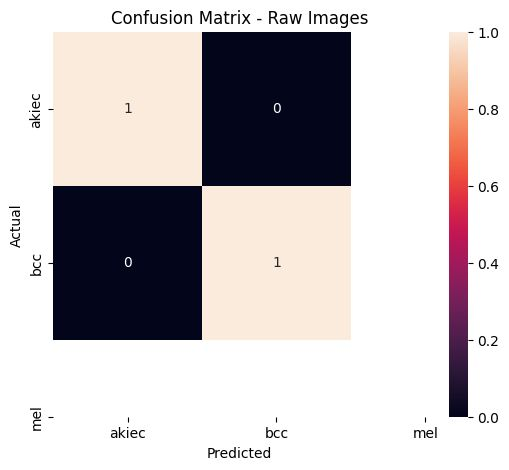

In [138]:
cm_raw = confusion_matrix(y[test_idx], raw_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm_raw,
    annot=True,
    fmt="d",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)

plt.title("Confusion Matrix - Raw Images")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

Confusion Matrix: Filtered Images

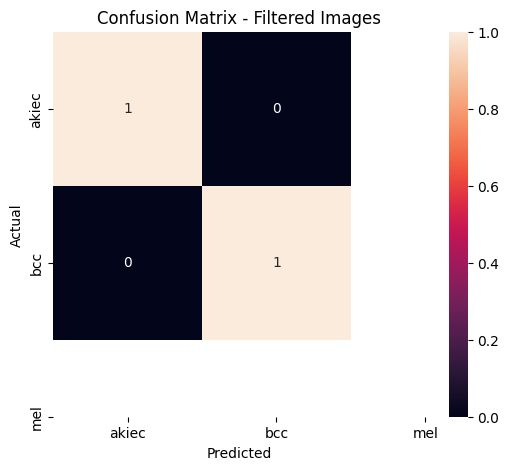

In [139]:
cm_filtered = confusion_matrix(y[test_idx], filtered_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm_filtered,
    annot=True,
    fmt="d",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)

plt.title("Confusion Matrix - Filtered Images")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

Confusion Matrix: Edge Images

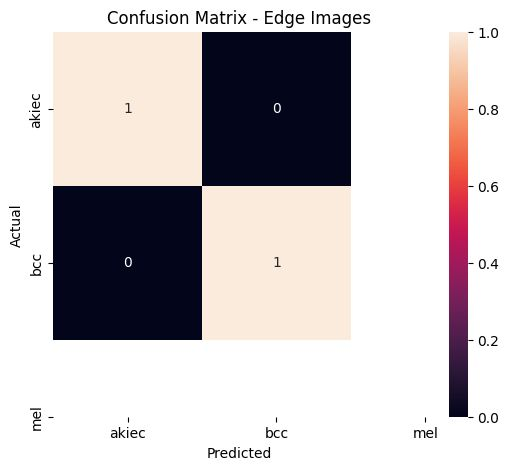

In [140]:
cm_edge = confusion_matrix(y[test_idx], edge_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm_edge,
    annot=True,
    fmt="d",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)

plt.title("Confusion Matrix - Edge Images")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

Prepare Metrics for Bar Chart

In [141]:
best_row = table3[
    table3["Model / Classifier"] == best_model_name
].iloc[0]

metrics = pd.DataFrame({
    "Image Type": [
        "Raw",
        "Filtered",
        "Edge"
    ],
    "Accuracy": [
        best_row["Accuracy Raw (Lab 1)"],
        best_row["Accuracy Filtered (Lab 2)"],
        best_row["Accuracy Edge (Lab 3)"]
    ]
})

metrics

,Image Type,Accuracy
0,Raw,1.0
1,Filtered,1.0
2,Edge,1.0


Accuracy Bar Chart

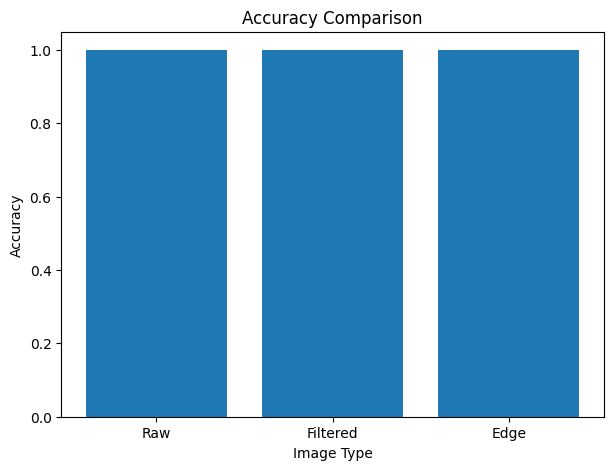

In [142]:
plt.figure(figsize=(7, 5))

plt.bar(
    metrics["Image Type"],
    metrics["Accuracy"]
)

plt.title("Accuracy Comparison")
plt.xlabel("Image Type")
plt.ylabel("Accuracy")

plt.show()

Precision, Recall, F1-score Comparison

                 Precision  Recall  F1-Score
Raw Images             1.0     1.0       1.0
Filtered Images        1.0     1.0       1.0
Edge Images            1.0     1.0       1.0


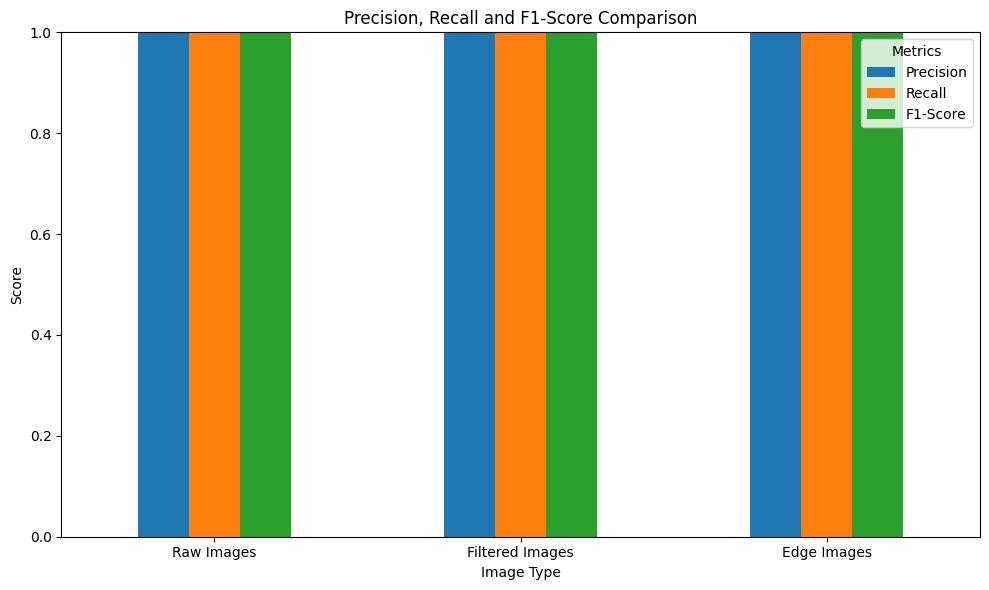

In [150]:
from sklearn.metrics import precision_score, recall_score, f1_score
import pandas as pd
import matplotlib.pyplot as plt

# Calculate metrics directly from predictions
raw_precision = precision_score(y_test, raw_pred, average="weighted", zero_division=0)
raw_recall = recall_score(y_test, raw_pred, average="weighted", zero_division=0)
raw_f1 = f1_score(y_test, raw_pred, average="weighted", zero_division=0)

filtered_precision = precision_score(y_test, filtered_pred, average="weighted", zero_division=0)
filtered_recall = recall_score(y_test, filtered_pred, average="weighted", zero_division=0)
filtered_f1 = f1_score(y_test, filtered_pred, average="weighted", zero_division=0)

edge_precision = precision_score(y_test, edge_pred, average="weighted", zero_division=0)
edge_recall = recall_score(y_test, edge_pred, average="weighted", zero_division=0)
edge_f1 = f1_score(y_test, edge_pred, average="weighted", zero_division=0)

# Create comparison table
comparison = pd.DataFrame({
    "Precision": [raw_precision, filtered_precision, edge_precision],
    "Recall": [raw_recall, filtered_recall, edge_recall],
    "F1-Score": [raw_f1, filtered_f1, edge_f1]
}, index=["Raw Images", "Filtered Images", "Edge Images"])

print(comparison.round(4))

# Bar chart
comparison.plot(
    kind="bar",
    figsize=(10, 6)
)

plt.title("Precision, Recall and F1-Score Comparison")
plt.xlabel("Image Type")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metrics")
plt.tight_layout()
plt.show()

# **Report**
1. Introduction

In this lab, edge detection techniques were applied to the HAM10000 skin lesion images. The aim was to see how different edge detection methods affect image classification performance.

2. Methodology

First, the original images were processed using different edge detection techniques such as Sobel, Prewitt, Laplacian, and Canny. Noise and Canny parameters were also tested. The best edge-detection result was then used for classification.

3. Experimental Setup

The experiments were performed using Python, OpenCV, NumPy, Pandas, Matplotlib, and Scikit-learn. Raw, filtered, and edge images were divided into training, validation, and testing sets. Different classification models were used and evaluated.

4. Results

The performance of raw, filtered, and edge images was compared using Accuracy, Precision, Recall, and F1-score. Confusion matrices and bar charts were also generated to compare the results.

5. Discussion

The results show how preprocessing and edge detection can change classification performance. The edge images were compared with the raw and filtered images to determine whether detecting image boundaries helped the classifier.

6. Conclusion

This lab helped us understand the effect of edge detection and image preprocessing on skin lesion classification. The comparison showed which image type and edge-detection approach worked better for the tested dataset.

7. References
HAM10000 Skin Lesion Dataset
OpenCV Documentation
Scikit-learn Documentation
Lab 03 instructions provided by the instructor